<a href="https://colab.research.google.com/github/XiangAlbert/StartInvest-Crack_Seg/blob/main/Crack_Seg.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
!pip install torch torchvision torchaudio
!pip install opencv-python-headless
!pip install matplotlib scipy numpy tqdm pillow


  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (99 kB)
  Using cached nvidia_nvjitlink_cu12-12.4.127-py3-non

### khanhha/crack_segmentation
https://github.com/khanhha/crack_segmentation?tab=readme-ov-file#Training

In [ ]:
model_path = '/content/drive/MyDrive/Road_surface_crack_detection/.model/model_unet_vgg_16_best.pt'
test_path = '/content/drive/MyDrive/Road_surface_crack_detection/test_pictures'

In [ ]:
!git clone https://github.com/khanhha/crack_segmentation.git


Cloning into 'crack_segmentation'...
remote: Enumerating objects: 488, done.
remote: Counting objects: 100% (54/54), done.
remote: Compressing objects: 100% (10/10), done.
remote: Total 488 (delta 45), reused 44 (delta 44), pack-reused 434
Receiving objects: 100% (488/488), 60.37 MiB | 41.94 MiB/s, done.
Resolving deltas: 100% (106/106), done.


In [ ]:
%cd crack_segmentation

/content/Crack-segmentation/crack_segmentation


In [ ]:
! python inference_unet.py -in_dir ./test_images -model_path ./models/model_unet_resnet_101_best.pt -out_dir ./test_result


Traceback (most recent call last):
  File "/content/Crack-segmentation/crack_segmentation/inference_unet.py", line 16, in <module>
    from utils import load_unet_vgg16, load_unet_resnet_101, load_unet_resnet_34
  File "/content/Crack-segmentation/crack_segmentation/utils.py", line 30
    return x.cuda(async=True) if torch.cuda.is_available() else x
                  ^^^^^
SyntaxError: invalid syntax


In [ ]:
!nano utils.py

/bin/bash: line 1: nano: command not found


In [ ]:
import os
import numpy as np
from PIL import Image
from keras.models import load_model

# Load the best model
model_path = 'bestmodel_grieta_unetb.h5'
model = load_model(model_path)


# Iterate over test images
for img_name in os.listdir(test_path):
    # Load the test image
    img_path = os.path.join(test_path, img_name)
    img = Image.open(img_path)

    # Preprocess the image (resize, normalize, etc.)
    # Example:
    img = img.resize((input_width, input_height))
    img = np.array(img) / 255.0  # Normalize to [0, 1]
    img = np.expand_dims(img, axis=0)  # Add batch dimension

    # Perform inference
    pred_mask = model.predict(img)

    # Postprocess the prediction (thresholding, resizing, etc.)
    # Example:
    pred_mask = (pred_mask > 0.5).astype(np.uint8)  # Thresholding
    pred_mask = pred_mask.squeeze()  # Remove batch dimension

    # Display or save the results
    # Example:
    pred_mask_img = Image.fromarray(pred_mask * 255)  # Convert to PIL Image
    pred_mask_img.show()  # Display the predicted mask
    pred_mask_img.save(os.path.join(output_path, img_name))  # Save the predicted mask


ValueError: Unknown metric function: 'f1'. Please ensure you are using a `keras.utils.custom_object_scope` and that this object is included in the scope. See https://www.tensorflow.org/guide/keras/save_and_serialize#registering_the_custom_object for details.

### **Summary:**
- This repo has both UNet_VGG16 and UNet_Resnet_101 based models, and accoring to the result table, the UNet_VGG16 performs better. However, due to the outdated Python and other library packages, running the repo is difficult w/o changes to the source code. Thus, we move on to yakhyo's repo. If we decided to use Resnet_101 or VGG16, we can use this as a reference to train the model ourselves.
- Transforms to tensor and then normalized the input images. But other than that, no more pre-processing during the training step.

### yakhyo/crack-segmentation
https://github.com/yakhyo/crack-segmentation


In [ ]:
! git clone https://github.com/yakhyo/crack-segmentation.git


Cloning into 'crack-segmentation'...
remote: Enumerating objects: 156, done.
remote: Counting objects: 100% (48/48), done.
remote: Compressing objects: 100% (32/32), done.
remote: Total 156 (delta 20), reused 27 (delta 16), pack-reused 108
Receiving objects: 100% (156/156), 109.28 MiB | 24.57 MiB/s, done.
Resolving deltas: 100% (55/55), done.


In [ ]:
%cd crack-segmentation/

/content/crack-segmentation


In [ ]:
%ls

assets/    demo.ipynb    LICENSE    requirements.txt  weights/
crackseg/  inference.py  README.md  train.py


In [ ]:
! python inference.py --weights weights/model.pt --input /content/drive/MyDrive/Road_surface_crack_detection/test_pictures/test-10.jpg

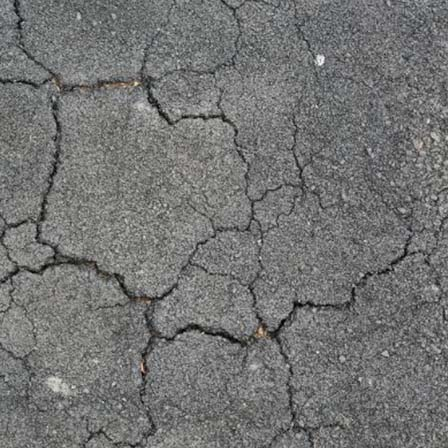

In [ ]:
from PIL import Image
Image.open('/content/drive/MyDrive/Road_surface_crack_detection/test_pictures/test-10.jpg')

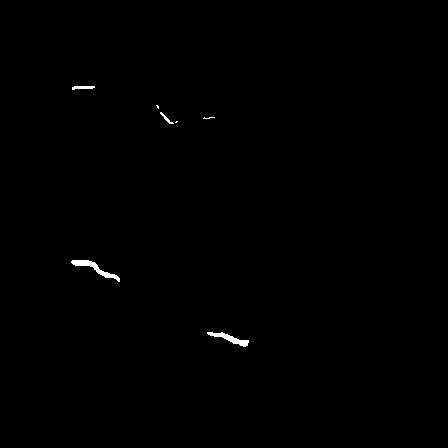

In [ ]:
Image.open('output.jpg')

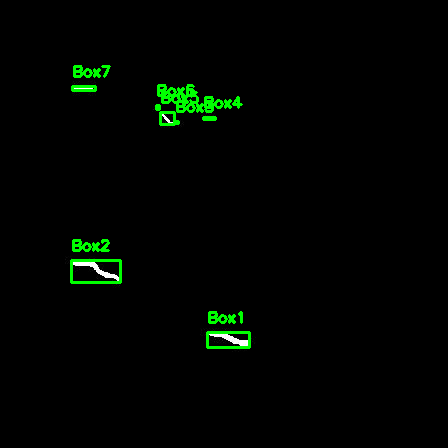

In [ ]:
from google.colab.patches import cv2_imshow
import cv2

# Load the output image
crack_image = cv2.imread('output.jpg', cv2.IMREAD_GRAYSCALE)

# Threshold the image to obtain a binary image
_, binary_image = cv2.threshold(crack_image, 127, 255, cv2.THRESH_BINARY)

# Find contours in the binary image
contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Draw bounding boxes and label them on a copy of the original image
image_with_boxes = cv2.cvtColor(crack_image, cv2.COLOR_GRAY2BGR)
for i, contour in enumerate(contours):
    x, y, w, h = cv2.boundingRect(contour)
    cv2.rectangle(image_with_boxes, (x, y), (x + w, y + h), (0, 255, 0), 2)
    cv2.putText(image_with_boxes, f'Box{i+1}', (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

# Display the result
cv2_imshow(image_with_boxes)


In [ ]:
from google.colab.patches import cv2_imshow
import cv2

# Load the output image
crack_image = cv2.imread('output.jpg', cv2.IMREAD_GRAYSCALE)

# Threshold the image to obtain a binary image
_, binary_image = cv2.threshold(crack_image, 127, 255, cv2.THRESH_BINARY)

# Find contours in the binary image
contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Draw bounding boxes and label them on a copy of the original image
image_with_boxes = cv2.cvtColor(crack_image, cv2.COLOR_GRAY2BGR)

# Dictionary to store measurements for each box
box_measurements = {}

for i, contour in enumerate(contours):
    x, y, w, h = cv2.boundingRect(contour)

    # Draw bounding box and label
    cv2.rectangle(image_with_boxes, (x, y), (x + w, y + h), (0, 255, 0), 2)
    cv2.putText(image_with_boxes, f'Box{i+1}', (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Get the region of interest (ROI) inside the bounding box
    roi = binary_image[y:y+h, x:x+w]

    # Find contours within the ROI
    roi_contours, _ = cv2.findContours(roi, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Calculate length, thickness, and region for each crack line within the ROI
    for j, roi_contour in enumerate(roi_contours):
        length = cv2.arcLength(roi_contour, True)
        area = cv2.contourArea(roi_contour)
        perimeter = cv2.arcLength(roi_contour, True)
        thickness = area / perimeter if perimeter > 0 else 0

        # Store measurements in the dictionary
        box_measurements[f'Box{i+1}_Crack{j+1}'] = {
            'length': length,
            'thickness': thickness,
            'region': roi_contour
        }

# Display the result
cv2_imshow(image_with_boxes)

# Print measurements for each crack line
for crack, measurements in box_measurements.items():
    print(f'{crack}: Length = {measurements["length"]}, Thickness = {measurements["thickness"]}')

error: OpenCV(4.8.0) /io/opencv/modules/imgproc/src/color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


4.8.0
Box1: Length = 0.0, Thickness = 0
Box2: Length = 0.0, Thickness = 0
Box3: Length = 5.656854152679443, Thickness = 0
Box4: Length = 20.14213538169861, Thickness = 0.09929433806791034
Box5: Length = 4.828427076339722, Thickness = 0
Box6: Length = 2.8284270763397217, Thickness = 0
Box7: Length = 0.0, Thickness = 0
Box8: Length = 0.0, Thickness = 0
Box9: Length = 13.071067690849304, Thickness = 0.11475726661947508
Box10: Length = 0.0, Thickness = 0
Box11: Length = 47.69848430156708, Thickness = 0.262062834554039
Box12: Length = 421.428493976593, Thickness = 1.4350432886166358
Box13: Length = 34.870057225227356, Thickness = 0.8459980380719796
Box14: Length = 9.656854152679443, Thickness = 0
Box15: Length = 77.74011445045471, Thickness = 0.8665859969389262
Box16: Length = 0.0, Thickness = 0
Box17: Length = 0.0, Thickness = 0
Box18: Length = 2.0, Thickness = 0
Box19: Length = 2.0, Thickness = 0
Box20: Length = 0.0, Thickness = 0
Box21: Length = 0.0, Thickness = 0
Box22: Length = 2.0, Th

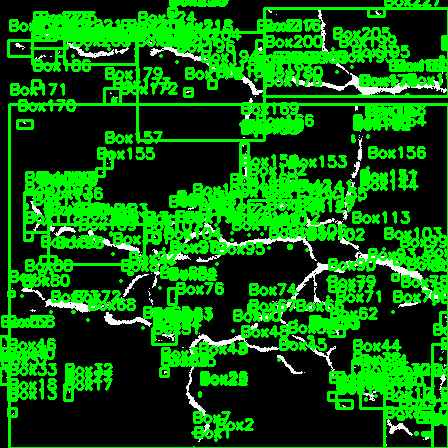

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Check OpenCV version
print(cv2.__version__)

# Load the binary image
binary_image = cv2.imread('output.jpg', cv2.IMREAD_GRAYSCALE)

# Find contours
contours, hierarchy = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2:]

# Dictionary to store length and thickness for each box
box_measurements = {}

# Create a colored copy of the image to draw the bounding boxes
image_with_boxes = cv2.cvtColor(binary_image, cv2.COLOR_GRAY2BGR)

# Merge nearby contours
merged_contours = []
for i in range(len(contours)):
    x, y, w, h = cv2.boundingRect(contours[i])
    is_merged = False
    for j, merged_contour in enumerate(merged_contours):
        x_m, y_m, w_m, h_m = cv2.boundingRect(merged_contour)
        if x >= x_m and x + w <= x_m + w_m and y >= y_m and y + h <= y_m + h_m:
            merged_contours[j] = np.concatenate((merged_contour, contours[i]), axis=0)
            is_merged = True
            break
    if not is_merged:
        merged_contours.append(contours[i])

# Iterate over merged contours within each bounding box
for i, merged_contour in enumerate(merged_contours):
    x, y, w, h = cv2.boundingRect(merged_contour)

    # Calculate length and thickness for the current box
    total_length = 0
    max_thickness = 0
    roi = binary_image[y:y+h, x:x+w]
    box_contours, _ = cv2.findContours(roi, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2:]
    for box_contour in box_contours:
        # Ensure contour is not empty
        if len(box_contour) > 0:
            # Calculate length of the contour (crack)
            length = cv2.arcLength(box_contour, True)
            for a in box_contour:
              if len(a) >30:
                print('box_contour:',a)
                print('======')
            total_length += length

            # Calculate approximate thickness of the contour (crack)
            moments = cv2.moments(box_contour)
            area = moments['m00']
            perimeter = cv2.arcLength(box_contour, True)
            if perimeter > 0:
                thickness = area / perimeter
                if thickness > max_thickness:
                    max_thickness = thickness

    # Store length and thickness in the dictionary
    box_measurements[f'Box{i+1}'] = {'length': total_length, 'thickness': max_thickness}

    # Draw bounding box and label on the image
    cv2.rectangle(image_with_boxes, (x, y), (x + w, y + h), (0, 255, 0), 2)
    cv2.putText(image_with_boxes, f'Box{i+1}', (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

# Print the length and thickness for each box
for box, measurements in box_measurements.items():
    print(f'{box}: Length = {measurements["length"]}, Thickness = {measurements["thickness"]}')

# Display the image with bounding boxes and labels
cv2_imshow(image_with_boxes)

### **Summary:**

**Loading the Output Image:**
- The output image ('output.jpg') is generated from the inference function with the trained model as the core, then loaded using OpenCV's cv2.imread() function in grayscale mode.

**Thresholding the Image:**
- The grayscale image is thresholded using OpenCV's cv2.threshold() function to obtain a binary image.

**Finding Contours:**
- Contours are found in the binary image using OpenCV's cv2.findContours() function with the cv2.RETR_EXTERNAL retrieval mode and cv2.CHAIN_APPROX_SIMPLE contour approximation method.

**Drawing Bounding Boxes and Labeling:**
- Bounding boxes are drawn around the contours, and each box is labeled with a unique identifier using OpenCV's cv2.rectangle() and cv2.putText() functions.

**Calculating Measurements:**
- For each bounding box:
  - The region of interest (ROI) inside the bounding box is extracted from the binary image.
  - Contours within the ROI are found using cv2.findContours().
  - For each contour within the ROI:
    - Length and area are calculated using cv2.arcLength() and cv2.contourArea().
    - Perimeter is calculated using cv2.arcLength().
    - Thickness is calculated as the ratio of area to perimeter.
    - Measurements are stored in a dictionary (box_measurements).

**Displaying the Result:**
- The original grayscale image with bounding boxes and labels is displayed using cv2_imshow().

**Printing Measurements:**
- For each crack line within each bounding box, measurements (length, thickness) are printed.


### Integration V1

In [ ]:
from PIL import Image
import os
import cv2
from IPython.display import Image as IPImage
import numpy as np

def resize_and_save_image(image_path, target_size):
    # Open the image
    image = Image.open(image_path)
    # Resize the image
    resized_image = image.resize(target_size, Image.LANCZOS)
    # Get the directory and file name
    directory, filename = os.path.split(image_path)
    # Split the file name and extension
    filename, extension = os.path.splitext(filename)
    # Construct the new file name
    new_filename = f"{filename}_resized{extension}"
    # Save the resized image
    resized_image.save(os.path.join(directory, new_filename))
    return os.path.join(directory, new_filename)

def preprocess_image(image_path):
    # Open the image using OpenCV
    opencv_image = cv2.imread(image_path)
    # Convert the image to grayscale
    gray_image = cv2.cvtColor(opencv_image, cv2.COLOR_BGR2GRAY)
    # Apply Gaussian blur to reduce noise
    blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)
    # Apply contrast enhancement using CLAHE (Contrast Limited Adaptive Histogram Equalization)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_image = clahe.apply(blurred_image)
    # Return the preprocessed image
    return Image.fromarray(enhanced_image)

def inference(image_path, model_weights):
    # Run inference
    ! python inference.py --weights {model_weights} --input {image_path}

def visualize_boxes(image_path):
    # Load the output image
    crack_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    # Threshold the image to obtain a binary image
    _, binary_image = cv2.threshold(crack_image, 127, 255, cv2.THRESH_BINARY)
    # Find contours in the binary image
    contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    # Draw bounding boxes and label them on a copy of the original image
    image_with_boxes = cv2.cvtColor(crack_image, cv2.COLOR_GRAY2BGR)
    # Dictionary to store measurements for each box
    box_measurements = {}
    for i, contour in enumerate(contours):
        x, y, w, h = cv2.boundingRect(contour)
        # Draw bounding box and label
        cv2.rectangle(image_with_boxes, (x, y), (x + w, y + h), (0, 255, 0), 2)
        cv2.putText(image_with_boxes, f'Box{i+1}', (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
        # Get the region of interest (ROI) inside the bounding box
        roi = binary_image[y:y+h, x:x+w]
        # Find contours within the ROI
        roi_contours, _ = cv2.findContours(roi, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        # Calculate length, thickness, and region for each crack line within the ROI
        for j, roi_contour in enumerate(roi_contours):
            length = cv2.arcLength(roi_contour, True)
            area = cv2.contourArea(roi_contour)
            perimeter = cv2.arcLength(roi_contour, True)
            thickness = area / perimeter if perimeter > 0 else 0
            # Store measurements in the dictionary
            box_measurements[f'Box{i+1}_Crack{j+1}'] = {
                'length': length,
                'thickness': thickness,
                'region': roi_contour
            }
    return image_with_boxes, box_measurements

def main(image_path, model_weights, target_size):
    # Preprocess the image
    preprocessed_image = preprocess_image(image_path)

    # Resize the preprocessed image
    resized_image = preprocessed_image.resize(target_size, Image.LANCZOS)

    # Convert resized image to numpy array
    resized_image_array = np.array(resized_image)

    # Convert RGB to BGR
    resized_image_bgr = cv2.cvtColor(resized_image_array, cv2.COLOR_RGB2BGR)

    # Run inference
    output_image = inference(resized_image_bgr, model_weights)

    # Visualize boxes
    image_with_boxes, box_measurements = visualize_boxes(output_image)

    # Display the result
    display(IPImage(data=image_with_boxes))

    # Print measurements for each crack line
    for crack, measurements in box_measurements.items():
        print(f'{crack}: Length = {measurements["length"]}, Thickness = {measurements["thickness"]}')

    # Return the image with boxes
    return image_with_boxes


# Input parameters
image_path = '/content/drive/MyDrive/Road_surface_crack_detection/test_pictures/cracked-pavement-example-bbt.jpg'
model_weights = "weights/model.pt"
target_size = (448, 448)  # The desired input image size
# Run the main function
main(image_path, model_weights, target_size)

usage: inference.py [-h] [--weights WEIGHTS] [--input INPUT] [--output OUTPUT] [--view]
                    [--no-save] [--conf-thresh CONF_THRESH]
inference.py: error: unrecognized arguments: 104 104]
/bin/bash: line 2: [114: command not found
/bin/bash: line 3: [123: command not found
/bin/bash: line 4: ...: command not found
/bin/bash: line 5: [137: command not found
/bin/bash: line 6: [127: command not found
/bin/bash: line 7: [102: command not found
/bin/bash: line 9: [[107: command not found
/bin/bash: line 10: [109: command not found
/bin/bash: line 11: [115: command not found
/bin/bash: line 12: ...: command not found
/bin/bash: line 13: [135: command not found
/bin/bash: line 14: [127: command not found
/bin/bash: line 15: [105: command not found
/bin/bash: line 17: [[132: command not found
/bin/bash: line 18: [130: command not found
/bin/bash: line 19: [113: command not found
/bin/bash: line 20: ...: command not found
/bin/bash: line 21: [139: command not found
/bin/bash: lin

error: OpenCV(4.8.0) /io/opencv/modules/imgproc/src/color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


#### DPI checking

In [ ]:
from PIL import Image
import os
import pandas as pd

# Directory containing the images
directory = "/content/drive/MyDrive/Road_surface_crack_detection/test_pictures/"

# Function to get DPI of an image
def get_image_dpi(image_path):
    with Image.open(image_path) as img:
        dpi = img.info.get('dpi')
        if dpi:
            return dpi
        else:
            return None

# List to store results
dpi_data = []

# Iterate through files in the directory
for filename in os.listdir(directory):
    if filename.endswith(".jpg") or filename.endswith(".png"):
        image_path = os.path.join(directory, filename)
        dpi = get_image_dpi(image_path)
        if dpi:
            dpi_data.append({"File Name": filename, "DPI": dpi})
        else:
            dpi_data.append({"File Name": filename, "DPI": "N/A"})

# Convert results to DataFrame
df = pd.DataFrame(dpi_data)

# Display results
df


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,File Name,DPI
0,like_crack_05.jpg,"(72, 72)"
1,CFD_019_image.jpg,N/A
2,cracked-pavement-example-bbt.jpg,"(84.0, 84.0)"
3,WeChat8d5c3b1071d10234a0f19171811555d3.jpg,"(144.0, 144.0)"
4,HgqMUzyWflN90CS3dy0gZnX9Ij9eJFkw1668532489.jpg,"(96.0, 96.0)"
5,cracked-pavement-example-bbt_resized.jpg,N/A
6,HgqMUzyWflN90CS3dy0gZnX9Ij9eJFkw1668532489_res...,N/A
7,test-0.jpg,"(72.0, 72.0)"
8,test-1.jpg,N/A
9,test-2.jpg,N/A


### Additional tests (figure out why HqgMUzyWflN9 isn't working as other images)
#### Using PS to form test-0 ~ test-9 variations based on HqgMUzyWflN9 and form var0-9 using Python


In [ ]:
! python inference.py --weights weights/model.pt --input /content/drive/MyDrive/Road_surface_crack_detection/test_pictures/test-9.jpg

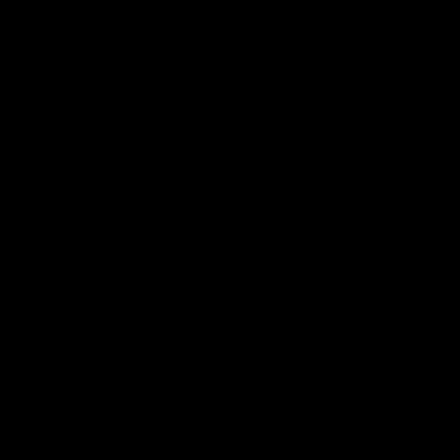

In [ ]:
from google.colab.patches import cv2_imshow
import cv2

# Load the output image
crack_image = cv2.imread('output.jpg', cv2.IMREAD_GRAYSCALE)

# Threshold the image to obtain a binary image
_, binary_image = cv2.threshold(crack_image, 127, 255, cv2.THRESH_BINARY)

# Find contours in the binary image
contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Draw bounding boxes and label them on a copy of the original image
image_with_boxes = cv2.cvtColor(crack_image, cv2.COLOR_GRAY2BGR)

# Dictionary to store measurements for each box
box_measurements = {}

for i, contour in enumerate(contours):
    x, y, w, h = cv2.boundingRect(contour)

    # Draw bounding box and label
    cv2.rectangle(image_with_boxes, (x, y), (x + w, y + h), (0, 255, 0), 2)
    cv2.putText(image_with_boxes, f'Box{i+1}', (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Get the region of interest (ROI) inside the bounding box
    roi = binary_image[y:y+h, x:x+w]

    # Find contours within the ROI
    roi_contours, _ = cv2.findContours(roi, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Calculate length, thickness, and region for each crack line within the ROI
    for j, roi_contour in enumerate(roi_contours):
        length = cv2.arcLength(roi_contour, True)
        area = cv2.contourArea(roi_contour)
        perimeter = cv2.arcLength(roi_contour, True)
        thickness = area / perimeter if perimeter > 0 else 0

        # Store measurements in the dictionary
        box_measurements[f'Box{i+1}_Crack{j+1}'] = {
            'length': length,
            'thickness': thickness,
            'region': roi_contour
        }

# Display the result
cv2_imshow(image_with_boxes)

# Print measurements for each crack line
for crack, measurements in box_measurements.items():
    print(f'{crack}: Length = {measurements["length"]}, Thickness = {measurements["thickness"]}')

In [ ]:
! python inference.py --weights weights/model.pt --input /content/drive/MyDrive/Road_surface_crack_detection/test_pictures/test-7.jpg

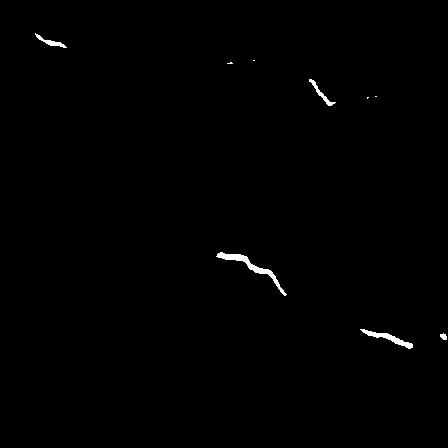

In [ ]:
from PIL import Image
Image.open('output.jpg')

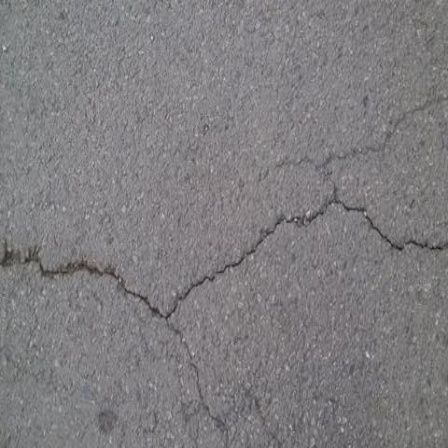

In [ ]:
Image.open('/content/drive/MyDrive/Road_surface_crack_detection/test_pictures/CFD_019_image.jpg')

<ipython-input-11-eba3fca9a90e>:9: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  resized_image = image.resize(target_size, Image.ANTIALIAS)


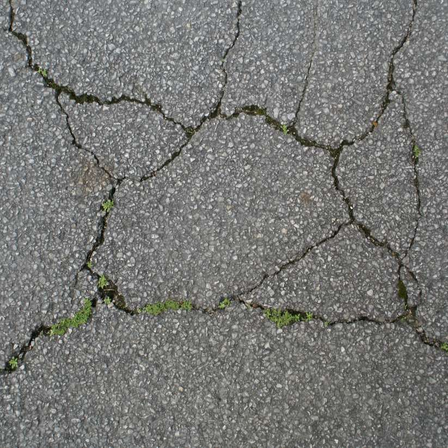

In [ ]:
from PIL import Image
import os

def resize_and_save_image(image_path, target_size):

    # Open the image
    image = Image.open(image_path)
    # Resize the image
    resized_image = image.resize(target_size, Image.ANTIALIAS)

    # Get the directory and file name
    directory, filename = os.path.split(image_path)
    # Split the file name and extension
    filename, extension = os.path.splitext(filename)
    # Construct the new file name
    new_filename = f"{filename}_resized{extension}"
    # Save the resized image
    resized_image.save(os.path.join(directory, new_filename))
    return resized_image


image_path = "/content/drive/MyDrive/Road_surface_crack_detection/test_pictures/cracked-pavement-example-bbt.jpg"
target_size = (448, 448)  # The desired input image size
resize_and_save_image(image_path, target_size)


In [ ]:
# Crop and save instead
from PIL import Image

def calculate_crop_box(image_width, image_height, target_width, target_height):
    # Calculate aspect ratios
    aspect_ratio = image_width / image_height
    target_aspect_ratio = target_width / target_height

    if aspect_ratio > target_aspect_ratio:
        # Crop width to fit target size
        new_width = target_aspect_ratio * image_height
        left = (image_width - new_width) / 2
        upper = 0
        right = left + new_width
        lower = image_height
    else:
        # Crop height to fit target size
        new_height = image_width / target_aspect_ratio
        left = 0
        upper = (image_height - new_height) / 2
        right = image_width
        lower = upper + new_height

    return (left, upper, right, lower)

# Open the image
image = Image.open("/content/drive/MyDrive/Road_surface_crack_detection/test_pictures/download.jpg")
image_width, image_height = image.size

# Target size
target_width, target_height = 448, 448

# Calculate crop box parameters
crop_box = calculate_crop_box(image_width, image_height, target_width, target_height)

# Crop the image
cropped_image = image.crop(crop_box)

# Display or save the cropped image
cropped_image.show()
cropped_image.save("cropped_image.jpg")  # Save the cropped image to a file


In [ ]:
from PIL import Image
import numpy as np

from PIL import Image
import numpy as np

def histogram_equalization(image):
    # Convert image to grayscale
    grayscale_image = image.convert("L")

    # Compute histogram
    histogram, bins = np.histogram(grayscale_image, bins=256, range=(0,256))

    # Compute cumulative distribution function (CDF)
    cdf = histogram.cumsum()
    cdf = (cdf - cdf.min()) * 255 / (cdf.max() - cdf.min())
    cdf = cdf.astype("uint8")

    # Apply histogram equalization
    equalized_image = np.interp(grayscale_image, bins[:-1], cdf)
    equalized_image = Image.fromarray(equalized_image.astype("uint8"))
    equalized_image.save("equalized_image.jpg")  # Save the equalized image as JPEG


    return equalized_image




# Open the image
image = Image.open("/content/drive/MyDrive/Road_surface_crack_detection/test_pictures/download.jpg")

# Apply histogram equalization
equalized_image = histogram_equalization(image)

# Display the original and equalized images
image.show()
equalized_image.show()


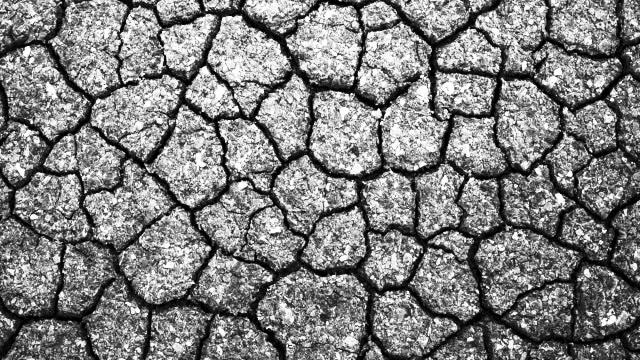

In [ ]:
Image.open('equalized_image.jpg')

<ipython-input-23-eba3fca9a90e>:9: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  resized_image = image.resize(target_size, Image.ANTIALIAS)


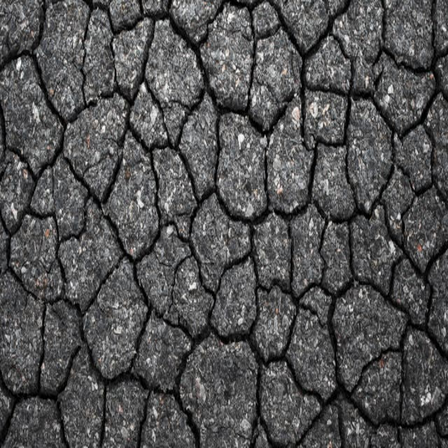

In [ ]:
resize_and_save_image("/content/drive/MyDrive/Road_surface_crack_detection/test_pictures/download.jpg",target_size)

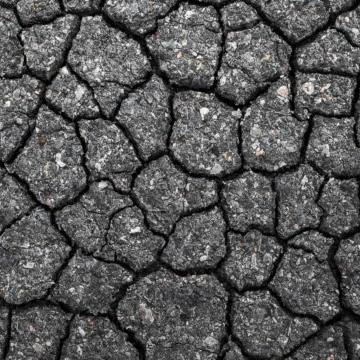

In [ ]:
Image.open("cropped_image.jpg")

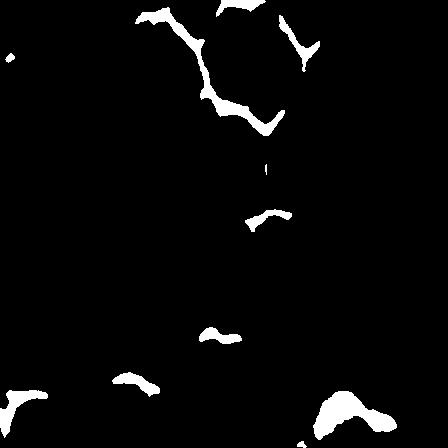

In [ ]:
! python inference.py --weights weights/model.pt --input "/content/drive/MyDrive/Road_surface_crack_detection/test_pictures/download_resized.jpg"
Image.open('output.jpg')

Traceback (most recent call last):
  File "/content/crack-segmentation/inference.py", line 106, in <module>
    main(params)
  File "/content/crack-segmentation/inference.py", line 93, in main
    output = predict(model=model, image=image, device=device, conf_thresh=opt.conf_thresh)
  File "/content/crack-segmentation/inference.py", line 52, in predict
    output = model(image).cpu()
  File "/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py", line 1532, in _wrapped_call_impl
    return self._call_impl(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py", line 1541, in _call_impl
    return forward_call(*args, **kwargs)
  File "/content/crack-segmentation/crackseg/models/unet.py", line 161, in forward
    x_ = self.up1(x4, x3)
  File "/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py", line 1532, in _wrapped_call_impl
    return self._call_impl(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/torch

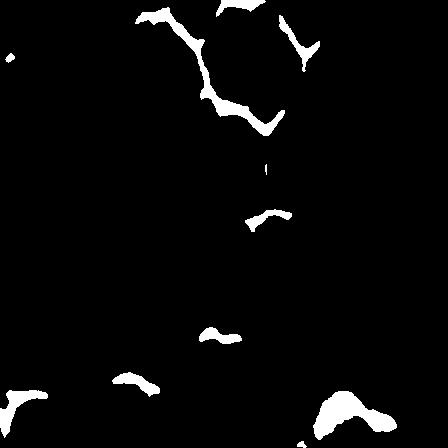

In [ ]:
! python inference.py --weights weights/model.pt --input "cropped_image.jpg"
Image.open('output.jpg')

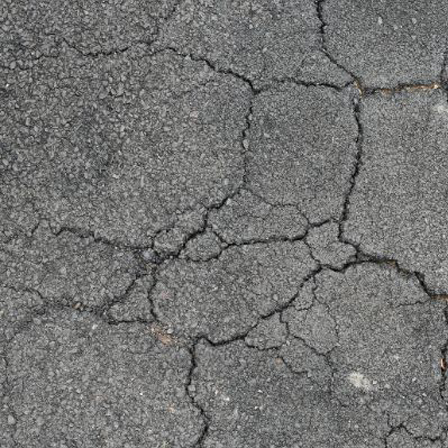

In [ ]:
Image.open('/content/drive/MyDrive/Road_surface_crack_detection/test_pictures/test-0.jpg')

In [ ]:
import cv2
import numpy as np
from PIL import ImageEnhance, Image
import matplotlib.pyplot as plt


def preprocess_image(image_path, output_path):
    # Open the image using PIL
    image = Image.open(image_path)

    # Convert the image to grayscale
    grayscale_image = image.convert('L')

    # Convert the grayscale image to numpy array
    np_image = np.array(grayscale_image)

    # Apply contrast enhancement using CLAHE (Contrast Limited Adaptive Histogram Equalization)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    opencv_image = clahe.apply(np_image)

    # Apply Gaussian blur to reduce noise
    opencv_image = cv2.GaussianBlur(opencv_image, (5, 5), 0)

    # Convert the NumPy array back to a PIL Image object
    preprocessed_image = Image.fromarray(opencv_image)

    # Save the preprocessed image as JPG
    preprocessed_image.save(output_path)

    # Display the preprocessed image using Matplotlib
    plt.imshow(preprocessed_image, cmap='gray')
    plt.axis('off')
    plt.show()

    # Return the preprocessed image
    return preprocessed_image


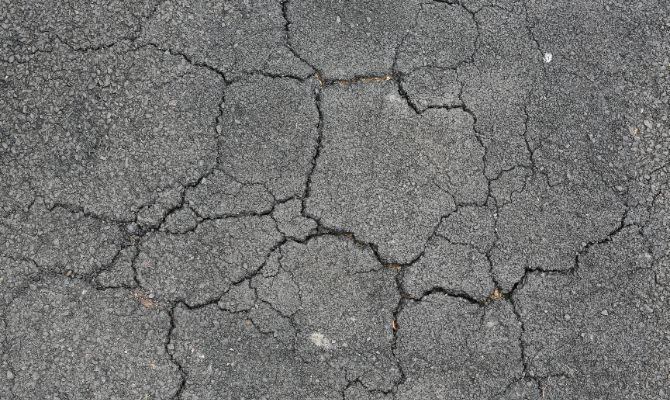

In [ ]:
Image.open('/content/drive/MyDrive/Road_surface_crack_detection/test_pictures/HgqMUzyWflN90CS3dy0gZnX9Ij9eJFkw1668532489.jpg')

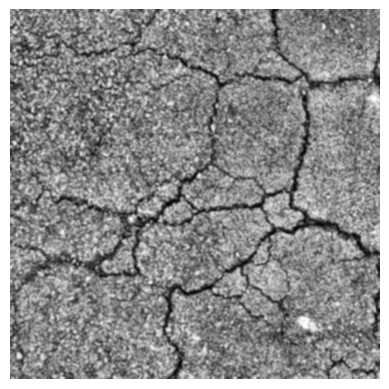

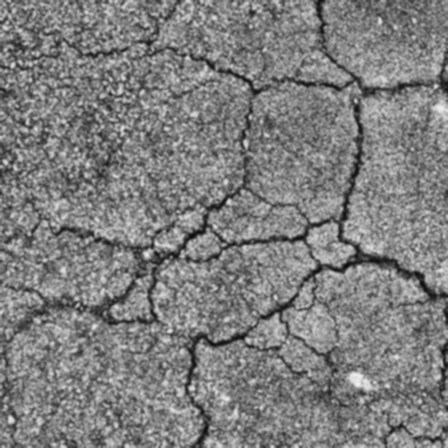

In [ ]:
input_image_path = '/content/drive/MyDrive/Road_surface_crack_detection/test_pictures/test-2.jpg'
output_image_path = "/content/drive/MyDrive/Road_surface_crack_detection/test_pictures/preprocessed_image.jpg"
preprocess_image(input_image_path, output_image_path)


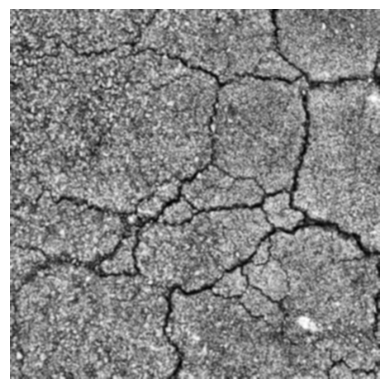

<ipython-input-130-819265ae3139>:9: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  resized_image = image.resize(target_size, Image.ANTIALIAS)


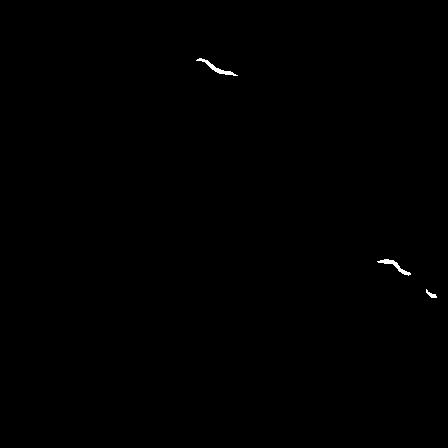

In [ ]:
# Example usage:
image_path = '/content/drive/MyDrive/Road_surface_crack_detection/test_pictures/test-0.jpg'
preprocess_image(image_path,output_image_path)
resize_and_save_image('/content/drive/MyDrive/Road_surface_crack_detection/test_pictures/preprocessed_image.jpg', target_size)
! python inference.py --weights weights/model.pt --input /content/drive/MyDrive/Road_surface_crack_detection/test_pictures/test-0.jpg
Image.open('output.jpg')


### **Methods tried so far:**


*   resize_and_save_image()
  * using image.resize() to convert to target_size(448,448) as required by the model
  * save the image with the 'original name' + '_resized.jpg' back into the original path
*   calculate_crop_box()
  * calculates the crop box parameters to fit target size while maintaining its aspect ratio
*   preprocess_image()
  * Grayscale Conversion
  * Contrast Enhancement (CLAHE)
  * Noise Reduction (Gaussian Blur)
  * Conversion back to PIL Image
*   histogram_equalization()
  * Improve contrast and enhancing the visibility, esp for uneven or poor exposure
  * Convert image to grayscale and then compute the histogram of pixelintensity values
  * calculates the cumulative distribution function (CDF) and normalizes it to [0,255].
  * Converts the equalized image back to PIL and saves it as 'equalized_image.jpg'


**Conclusion:** Resize is crucial to have the input image to confront to the model input requirements. None of the other methods work so far.

**Main Hypothesis:** The trained model doesn't have comprehensive pre-processing step, making it sensitive to the origianl training dataset/less generalizable. We could use the UNet as the backbone and re-train the model with more image auguementation to make it more robust.



### RyM-CIC/Crack-segmentation

https://github.com/RyM-CIC/Crack-segmentation.git

In [ ]:
import os
os.kill(os.getpid(), 9)

In [ ]:
!git clone https://github.com/RyM-CIC/Crack-segmentation.git

Cloning into 'Crack-segmentation'...
remote: Enumerating objects: 27, done.
remote: Total 27 (delta 0), reused 0 (delta 0), pack-reused 27
Receiving objects: 100% (27/27), 21.73 MiB | 31.64 MiB/s, done.
Resolving deltas: 100% (9/9), done.


In [ ]:
%ls

Crack-segmentation/  drive/  sample_data/


In [ ]:
%cd Crack-segmentation/

/content/Crack-segmentation


In [ ]:
%ls

 bestmodel_grieta_unetb.h5   README.md  'U-Net Models.ipynb'  'VGG16 Modified.ipynb'


In [ ]:
%cd Crack-segmentation/

/content/crack-segmentation/Crack-segmentation


In [ ]:
%ls

 bestmodel_grieta_unetb.h5   README.md  'U-Net Models.ipynb'  'VGG16 Modified.ipynb'


In [ ]:
# @title load the new model with the custom F1 key
from keras.models import load_model
def f1(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    tp = K.sum(y_true_f * y_pred_f)
    fp = K.sum(K.clip(K.clip(y_pred_f + y_true_f, 0, 1) - y_true_f, 0, 1))
    fn = K.sum(K.clip(K.clip(y_pred_f + y_true_f, 0, 1) - y_pred_f, 0, 1))
    Pr = tp / (tp + fp)
    Re = tp / (tp + fn)
    f1t = 2 * (Pr * Re) / (Pr + Re)
    return f1t

# Load the model
model = load_model('/content/Crack-segmentation/bestmodel_grieta_unetb.h5', custom_objects={'f1': f1})



1/1 [==============================] - 5s 5s/step


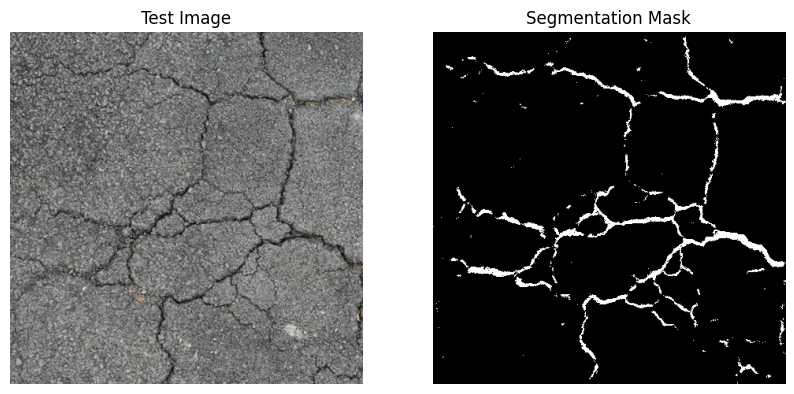

1/1 [==============================] - 3s 3s/step


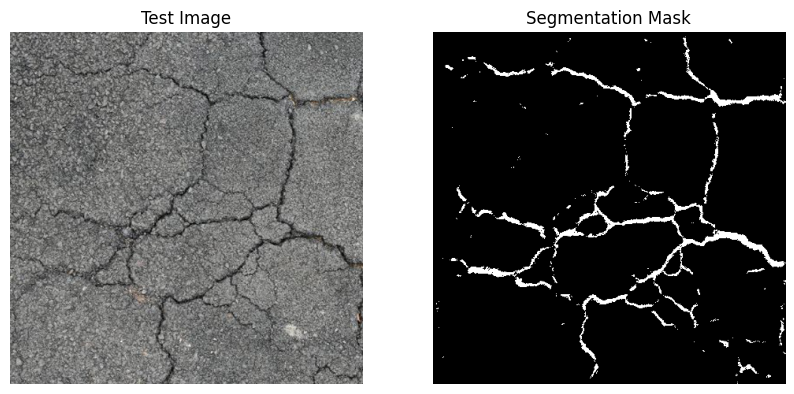

1/1 [==============================] - 3s 3s/step


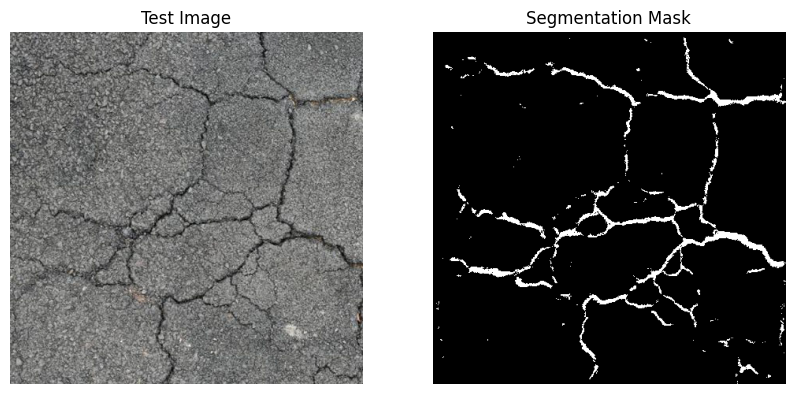

1/1 [==============================] - 4s 4s/step


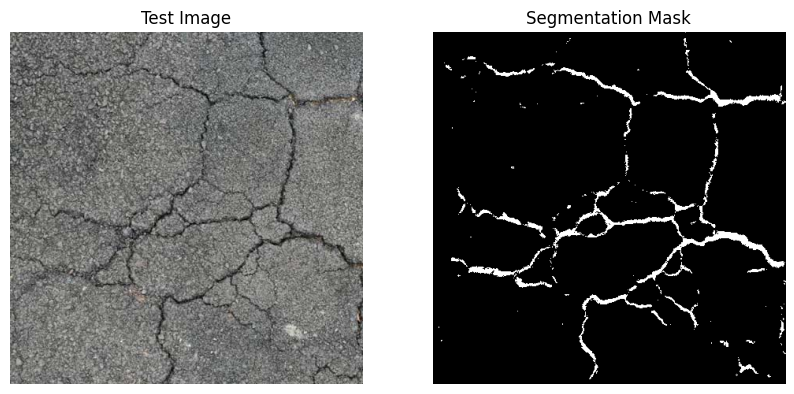

1/1 [==============================] - 3s 3s/step


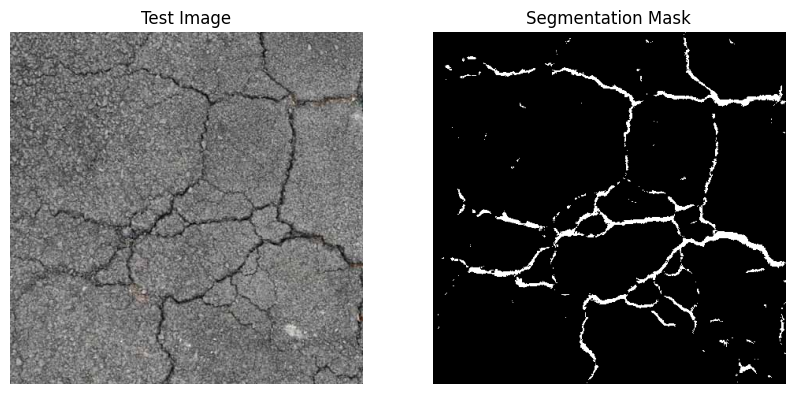

1/1 [==============================] - 5s 5s/step


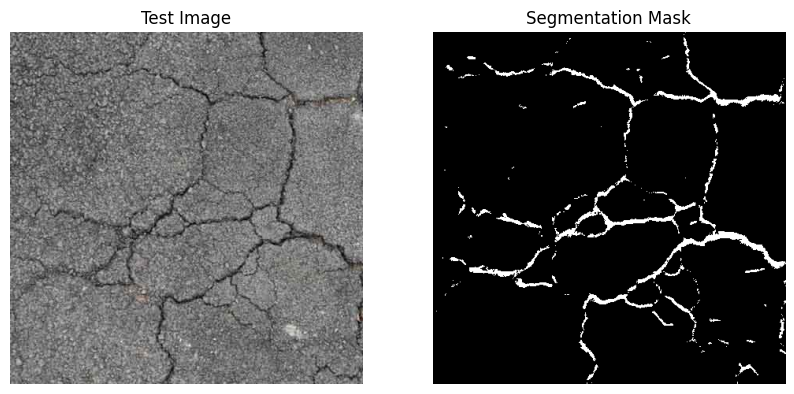

1/1 [==============================] - 4s 4s/step


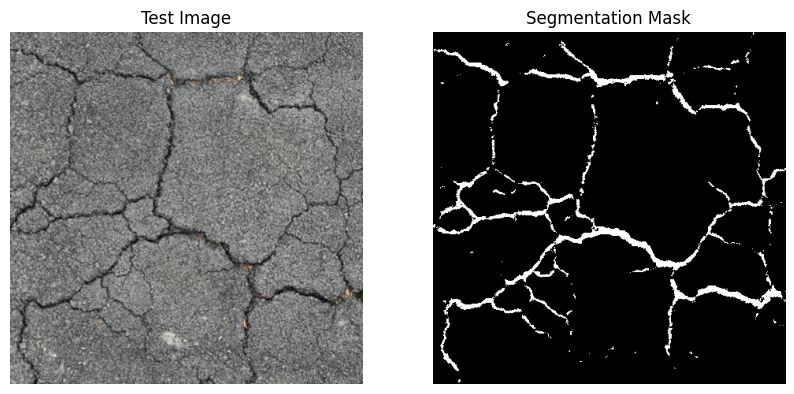

1/1 [==============================] - 4s 4s/step


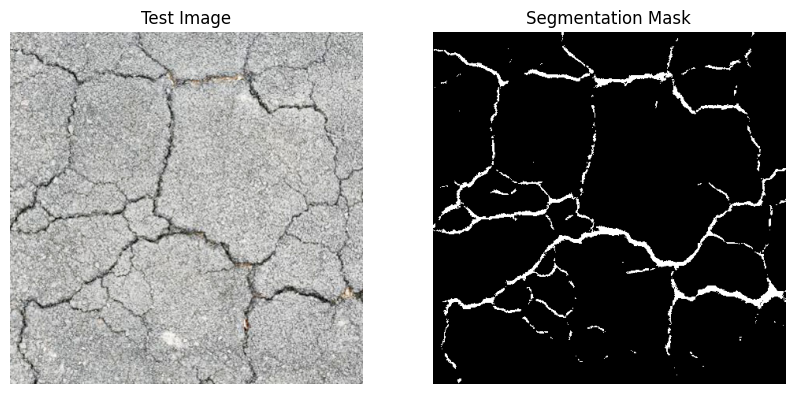

1/1 [==============================] - 6s 6s/step


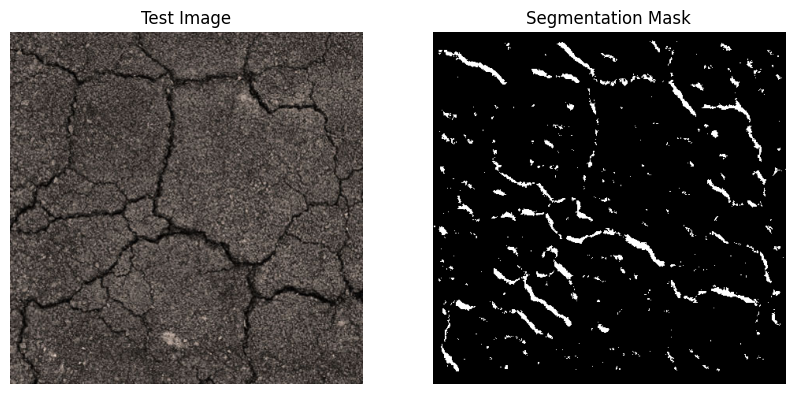

1/1 [==============================] - 3s 3s/step


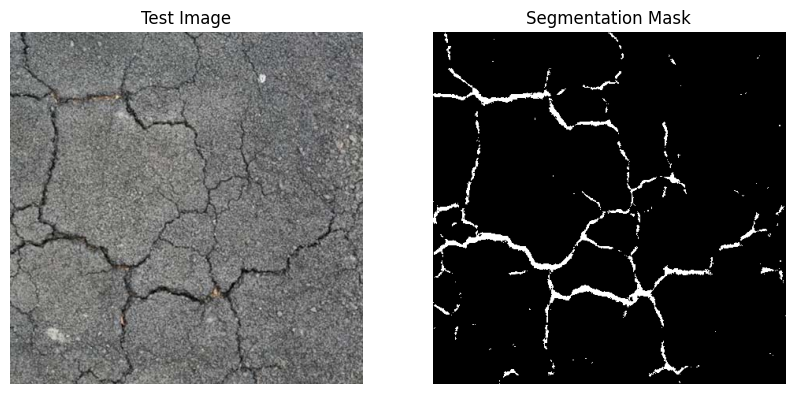

1/1 [==============================] - 4s 4s/step


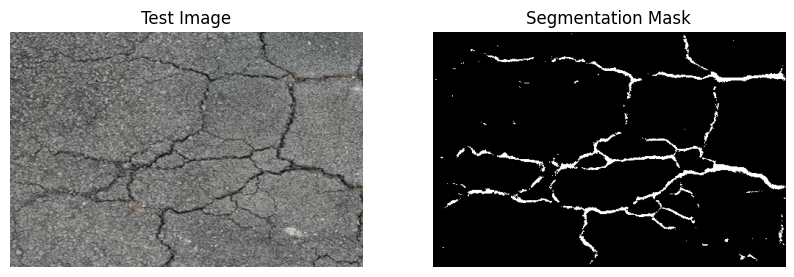

In [ ]:
# @title trial on test-0 ~ test-10 with new model

import numpy as np
import matplotlib.pyplot as plt
import os

# Directory containing test images
test_image_dir = '/content/drive/MyDrive/Road_surface_crack_detection/test_pictures/'

# List all test image files
test_image_files = [f for f in os.listdir(test_image_dir) if f.startswith('test') and f.endswith('.jpg')]

# Create a folder to save the segmentation results if it doesn't exist
output_dir = '/content/drive/MyDrive/Road_surface_crack_detection/test_result/'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Loop through each test image
for test_image_file in test_image_files:
    # Load the test image
    test_image_path = os.path.join(test_image_dir, test_image_file)
    test_image = Image.open(test_image_path)

    # Perform segmentation
    segmentation_mask = model.predict(np.expand_dims(test_image, axis=0))

    # Post-process the segmentation mask
    # For example, thresholding the mask
    threshold = 0.5
    binary_mask = segmentation_mask > threshold

    binary_mask_image = Image.fromarray((binary_mask[0, :, :, 0] * 255).astype(np.uint8))

    # Save the segmentation mask image with a unique name for each test image
    output_filename = f"output_{test_image_file.split('.')[0]}.jpg"
    output_path = os.path.join(output_dir, output_filename)
    binary_mask_image.save(output_path)

    # Visualize the segmentation result (optional)
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(test_image)
    plt.title('Test Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(binary_mask[0, :, :, 0], cmap='gray')
    plt.title('Segmentation Mask')
    plt.axis('off')

    plt.show()


Original Image: cracked-pavement-example-bbt
1/1 [==============================] - 4s 4s/step


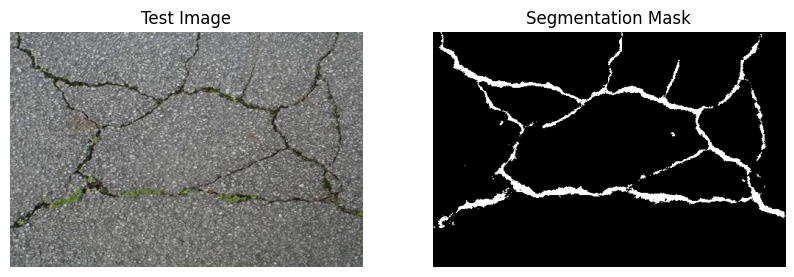

Original Image: download
1/1 [==============================] - 4s 4s/step


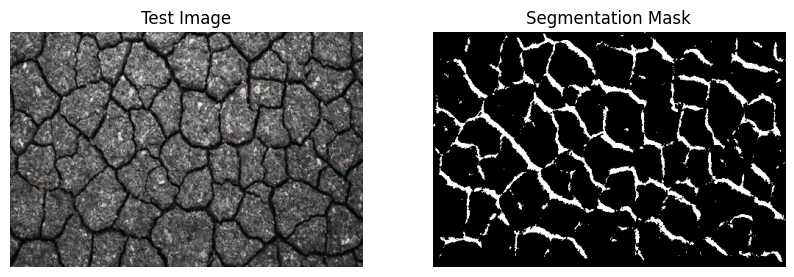

Original Image: download
1/1 [==============================] - 3s 3s/step


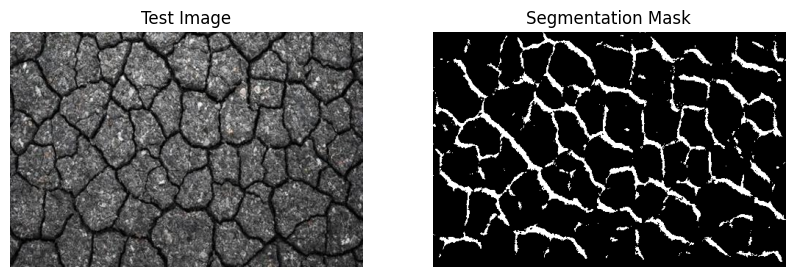

Original Image: CFD_019_image
1/1 [==============================] - 3s 3s/step


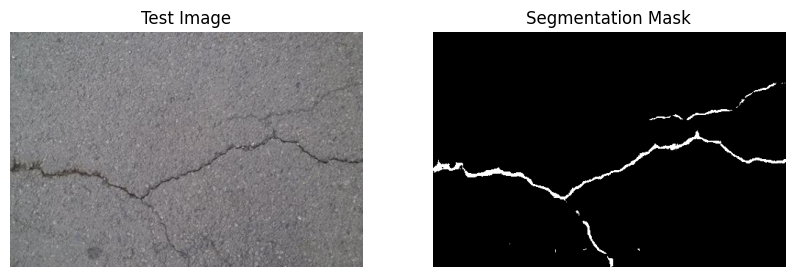

In [ ]:
# @title Testing other images inside the test_picture folder with new model
import numpy as np
import matplotlib.pyplot as plt
import os

# Function to resize and save an image
def resize_and_save_image(image_path, target_size):
    img = Image.open(image_path)
    resized_img = img.resize(target_size)
    output_path = os.path.join('/content/drive/MyDrive/Road_surface_crack_detection/test_pic_380/', os.path.basename(image_path).replace('.jpg', '_resized_380.jpg'))
    resized_img.save(output_path)

# Directory containing test images
test_image_dir = '/content/drive/MyDrive/Road_surface_crack_detection/test_pictures/'

# Create a folder to save resized images if it doesn't exist
resized_image_dir = '/content/drive/MyDrive/Road_surface_crack_detection/test_pic_380/'
if not os.path.exists(resized_image_dir):
    os.makedirs(resized_image_dir)

# List all test image files
test_image_files = [f for f in os.listdir(test_image_dir) if f.endswith('.jpg')]

# Resize and save all test images if not already resized
for test_image_file in test_image_files:
    resized_image_path = os.path.join(resized_image_dir, os.path.basename(test_image_file).replace('.jpg', '_resized_380.jpg'))
    if not os.path.exists(resized_image_path):
        test_image_path = os.path.join(test_image_dir, test_image_file)
        resize_and_save_image(test_image_path, (480, 320))

# Directory containing resized test images
resized_test_image_dir = '/content/drive/MyDrive/Road_surface_crack_detection/test_pic_380/'
# Directory to save segmentation results
output_dir = '/content/drive/MyDrive/Road_surface_crack_detection/test_result/'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# List all resized test image files
resized_test_image_files = [f for f in os.listdir(resized_test_image_dir) if f.endswith('_resized_380.jpg')]

# Loop through each resized test image
for test_image_file in resized_test_image_files:
    # Check if result already exists
    result_file = os.path.join(output_dir, f"output_{test_image_file.split('.')[0]}.jpg")
    if os.path.exists(result_file):
        continue  # Result already exists, skip processing

    # Load the resized test image
    test_image_path = os.path.join(resized_test_image_dir, test_image_file)
    test_image = Image.open(test_image_path)

    try:
        # Print the original image name
        original_image_name = test_image_file.split('_resized_')[0]
        print("Original Image:", original_image_name)

        # Perform segmentation
        segmentation_mask = model.predict(np.expand_dims(test_image, axis=0))

        # Post-process the segmentation mask
        # For example, thresholding the mask
        threshold = 0.5
        binary_mask = segmentation_mask > threshold

        binary_mask_image = Image.fromarray((binary_mask[0, :, :, 0] * 255).astype(np.uint8))

        # Save the segmentation mask image with a unique name for each test image
        output_filename = f"output_{original_image_name}.jpg"
        output_path = os.path.join(output_dir, output_filename)
        binary_mask_image.save(output_path)

        # Visualize the segmentation result
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(test_image)
        plt.title('Test Image')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(binary_mask[0, :, :, 0], cmap='gray')
        plt.title('Segmentation Mask')
        plt.axis('off')

        plt.show()

    except Exception as e:
        print(f"Error processing image {test_image_file}")


In [ ]:
# @title detect_valid_cracks function, takes model's output, boxes valid cracks, and measures the length and thickness
from google.colab.patches import cv2_imshow
import cv2

def detect_valid_cracks(input_image_path):
    # Load the output image
    crack_image = cv2.imread(input_image_path, cv2.IMREAD_GRAYSCALE)

    # Threshold the image to obtain a binary image
    _, binary_image = cv2.threshold(crack_image, 127, 255, cv2.THRESH_BINARY)

    # Find contours in the binary image
    contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Draw bounding boxes and label them on a copy of the original image
    image_with_boxes = cv2.cvtColor(crack_image, cv2.COLOR_GRAY2BGR)

    # Dictionary to store measurements for each box
    box_measurements = {}

    for i, contour in enumerate(contours):
        x, y, w, h = cv2.boundingRect(contour)

        # Get the region of interest (ROI) inside the bounding box
        roi = binary_image[y:y+h, x:x+w]

        # Find contours within the ROI
        roi_contours, _ = cv2.findContours(roi, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # Calculate length, thickness, and region for each crack line within the ROI
        for j, roi_contour in enumerate(roi_contours):
            length = cv2.arcLength(roi_contour, True)
            area = cv2.contourArea(roi_contour)
            perimeter = cv2.arcLength(roi_contour, True)
            thickness = area / perimeter if perimeter > 0 else 0

            # Only include measurements if length and thickness are non-zero
            if length > 0 and thickness > 0:
                # Draw bounding box and label
                cv2.rectangle(image_with_boxes, (x, y), (x + w, y + h), (0, 255, 0), 2)
                cv2.putText(image_with_boxes, f'Box{i+1}', (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

                # Store measurements in the dictionary
                box_measurements[f'Box{i+1}_Crack{j+1}'] = {
                    'length': length,
                    'thickness': thickness,
                    'region': roi_contour
                }

    # Display the result
    cv2_imshow(image_with_boxes)

    # Print measurements for each crack line
    for crack, measurements in box_measurements.items():
        print(f'{crack}: Length = {measurements["length"]}, Thickness = {measurements["thickness"]}')

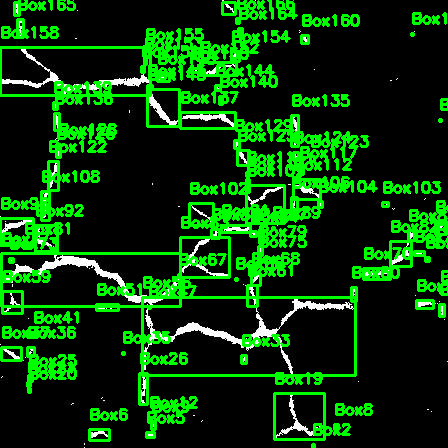

Box2_Crack1: Length = 4.828427076339722, Thickness = 0.20710678326285678
Box5_Crack2: Length = 20.485281229019165, Thickness = 0.48815536814960286
Box6_Crack1: Length = 55.11269760131836, Thickness = 0.9798105037541885
Box8_Crack1: Length = 8.828427076339722, Thickness = 0.11327046045155774
Box9_Crack1: Length = 17.313708305358887, Thickness = 0.3465462103310877
Box12_Crack1: Length = 4.828427076339722, Thickness = 0.20710678326285678
Box19_Crack1: Length = 218.0071403980255, Thickness = 0.9472166811737616
Box20_Crack1: Length = 6.828427076339722, Thickness = 0.14644661044488086
Box21_Crack1: Length = 8.242640614509583, Thickness = 0.4246212061992517
Box25_Crack1: Length = 15.071067690849304, Thickness = 0.5639945473246691
Box26_Crack1: Length = 81.35533845424652, Thickness = 0.6821924787543313
Box33_Crack1: Length = 20.727921843528748, Thickness = 0.4583189801521708
Box35_Crack1: Length = 3.414213538169861, Thickness = 0.14644661044488086
Box36_Crack1: Length = 26.97056221961975, Thic

In [ ]:
# @title Example usage of detect_valid_cracks function on test-10.jpg:
input_image_path = '/content/drive/MyDrive/Road_surface_crack_detection/test_result/output_test-10.jpg'
detect_valid_cracks(input_image_path)


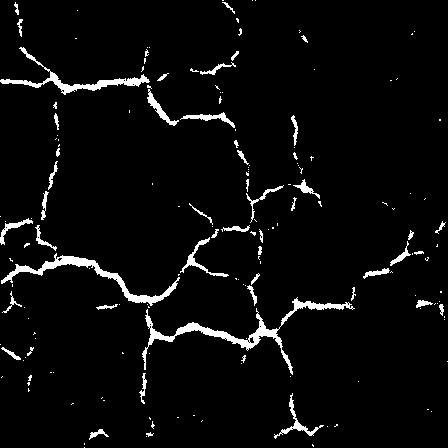

In [ ]:
Image.open(input_image_path)

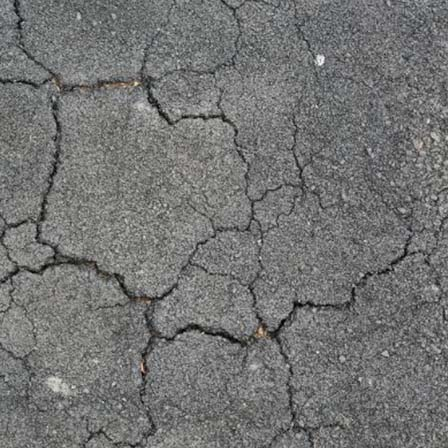

In [ ]:
Image.open('/content/drive/MyDrive/Road_surface_crack_detection/test_pictures/test-10.jpg')

In [ ]:
# @title crack_line() function. Create the instance segmentation based on the previous segemenation output, converting the array into a coordinat system for robot guidance. [Optional coordinates are provided for each crack identified commented out at the end].
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def crack_line(input_image_path):
    # Load segmentation image (white line on black background)
    segmentation_image = cv2.imread(input_image_path, cv2.IMREAD_GRAYSCALE)

    # Threshold image to extract cracks
    _, binary_image = cv2.threshold(segmentation_image, 127, 255, cv2.THRESH_BINARY)

    # Find contours of cracks
    contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Convert the contours to coordinate format
    crack_coordinates = []
    for contour in contours:
        contour_coords = contour.squeeze().tolist()
        # Ignore contours with only one coordinate
        if len(contour_coords) > 1:
            crack_coordinates.append(contour_coords)

    # Create blank image for visualization
    segmentation_result = np.zeros_like(segmentation_image)

    # Draw contours (cracks) on blank image with dotted lines
    for contour in contours:
        segmentation_result = cv2.drawContours(segmentation_result, [contour], -1, (255, 255, 255), 2, cv2.LINE_AA)

    return segmentation_result, crack_coordinates


# Example usage:
# segmentation_result, crack_coordinates = crack_line('/content/drive/MyDrive/Road_surface_crack_detection/test_result/output_test-10.jpg')
# print(crack_coordinates)


array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)
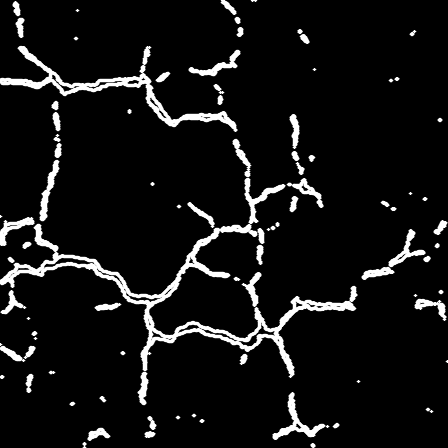

In [ ]:
input_path = '/content/drive/MyDrive/Road_surface_crack_detection/test_result/output_test-10.jpg'
segmentation_result, crack_coordinates = crack_line(input_path)
segmentation_result
# crack_coordinates

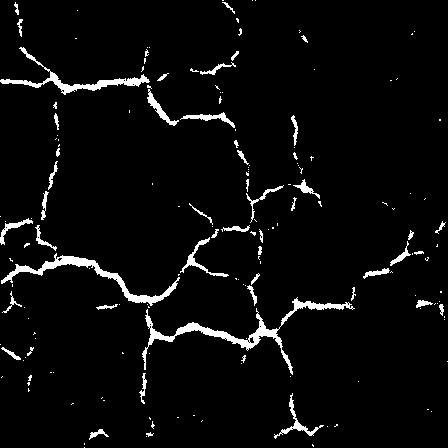

In [ ]:
Image.open('/content/drive/MyDrive/Road_surface_crack_detection/test_result/output_test-10.jpg')


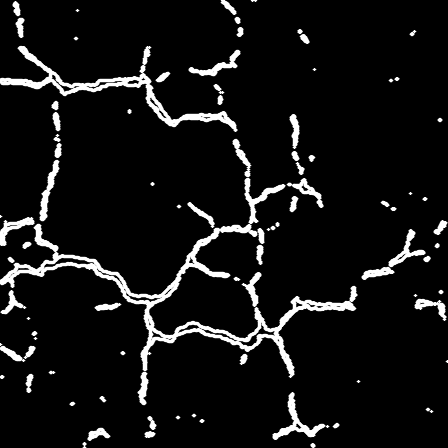

Crack 1 coordinates:
84
447
Crack 2 coordinates:
[312, 444]
[312, 445]
[313, 446]
[313, 445]
Crack 3 coordinates:
[84, 443]
[84, 444]
Crack 4 coordinates:
146
436
Crack 5 coordinates:
[150, 432]
[149, 433]
[146, 433]
[146, 434]
[147, 434]
[148, 435]
[148, 436]
[149, 435]
[152, 435]
[152, 434]
[153, 433]
[152, 434]
[151, 434]
[150, 433]
Crack 6 coordinates:
[99, 429]
[98, 430]
[98, 431]
[97, 432]
[94, 432]
[93, 433]
[92, 432]
[91, 432]
[90, 433]
[91, 434]
[90, 435]
[90, 437]
[89, 438]
[89, 439]
[91, 437]
[92, 437]
[93, 436]
[95, 436]
[98, 433]
[103, 433]
[106, 436]
[108, 436]
[106, 434]
[105, 434]
[104, 433]
[104, 432]
[102, 430]
[102, 429]
Crack 7 coordinates:
327
426
Crack 8 coordinates:
[336, 424]
[336, 425]
[335, 426]
[334, 426]
[335, 426]
[336, 425]
[337, 425]
[337, 424]
Crack 9 coordinates:
[152, 421]
[152, 424]
[151, 425]
[151, 426]
[153, 428]
[152, 427]
[154, 425]
[152, 423]
Crack 10 coordinates:
[202, 420]
[201, 421]
Crack 11 coordinates:
[177, 417]
[178, 417]
Crack 12 coordina

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load segmentation image (white line on black background)
segmentation_image = cv2.imread('/content/drive/MyDrive/Road_surface_crack_detection/test_result/output_test-10.jpg', cv2.IMREAD_GRAYSCALE)

# Threshold image to extract cracks
_, binary_image = cv2.threshold(segmentation_image, 127, 255, cv2.THRESH_BINARY)

# Find contours of cracks
contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Create blank image for visualization
segmentation_result = np.zeros_like(segmentation_image)

# Convert the blank image to uint8 data type
segmentation_result = segmentation_result.astype(np.uint8)

# Draw contours (cracks) on blank image with dotted lines
for contour in contours:
    segmentation_result = cv2.drawContours(segmentation_result, [contour], -1, (255, 255, 255), 2, cv2.LINE_AA)

# Convert contours to coordinate format
crack_coordinates = []
for contour in contours:
    contour_coords = contour.squeeze().tolist()
    crack_coordinates.append(contour_coords)

# Show segmentation result
cv2_imshow(segmentation_result)

# Print crack coordinates (optional)
for i, coords in enumerate(crack_coordinates):
    print(f"Crack {i+1} coordinates:")
    for coord in coords:
        print(coord)


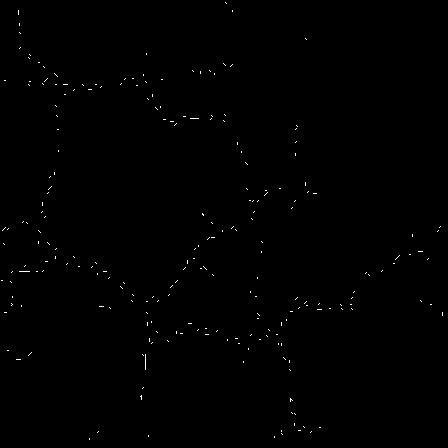

In [ ]:
# @title dots representing the edge of the cracks
from google.colab.patches import cv2_imshow
import cv2
import numpy as np

# Load segmentation image (white line on black background)
segmentation_image = cv2.imread('/content/drive/MyDrive/Road_surface_crack_detection/test_result/output_test-10.jpg', cv2.IMREAD_GRAYSCALE)

# Threshold image to extract cracks
_, binary_image = cv2.threshold(segmentation_image, 127, 255, cv2.THRESH_BINARY)

# Find contours of cracks
contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Create blank image for visualization
segmentation_result = np.zeros_like(segmentation_image, dtype=np.uint8)

# Iterate through contours
for contour in contours:
    # Approximate contour to reduce the number of points
    epsilon = 0.0001 * cv2.arcLength(contour, True)
    approx = cv2.approxPolyDP(contour, epsilon, True)

    # Draw dotted line connecting key points
    for i in range(1, len(approx)):
        if i % 10 == 0:  # Adjust this value to control density of key points
            cv2.line(segmentation_result, tuple(approx[i-1][0]), tuple(approx[i][0]), (255), thickness=1)

# Show segmentation result
cv2_imshow(segmentation_result)


#### Just learned that this dotted edges could be done with skeletonization

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import KDTree
from skimage.graph import route_through_array

def smooth_path(coordinates):
    # Create a KDTree for efficient nearest neighbor search
    tree = KDTree(coordinates)

    # Find the nearest neighbor for each point
    nearest_neighbors = [tree.query(point)[1] for point in coordinates]

    # Remove duplicates (if any)
    unique_neighbors = list(set(nearest_neighbors))

    # Sort the unique neighbor indices
    unique_neighbors.sort()

    # Extract the unique points
    unique_points = [coordinates[idx] for idx in unique_neighbors]

    return unique_points

def plot_smoothed_path(coordinates):
    smoothed_path = smooth_path(coordinates)

    # Convert coordinates to NumPy array for easier manipulation
    smoothed_path = np.array(smoothed_path)

    # Plot the smoothed path
    plt.figure(figsize=(8, 6))
    plt.plot(smoothed_path[:, 0], smoothed_path[:, 1], marker='o', markersize=5, linestyle='-')
    plt.title('Smoothed Robot Path')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.grid(True)
    plt.show()





In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_crack_coordinates(coordinates):
    # Extract x and y coordinates from the list
    x_coords, y_coords = zip(*coordinates)

    # Plot the crack coordinates
    plt.figure(figsize=(8, 6))
    plt.plot(x_coords, y_coords, 'bo-', markersize=3, label='Crack Line')
    plt.title('Crack Line Coordinates')
    plt.xlabel('X Coordinate')
    plt.ylabel('Y Coordinate')
    plt.grid(True)
    plt.legend()
    plt.show()

def plot_robot_path(coordinates):
    # Extract x and y coordinates from the list
    x_coords, y_coords = zip(*coordinates)

    # Initialize the robot's path
    robot_path = []

    # Iterate through the crack coordinates
    for i in range(len(x_coords) - 1):
        x1, y1 = x_coords[i], y_coords[i]
        x2, y2 = x_coords[i+1], y_coords[i+1]

        # Calculate the Euclidean distance between two consecutive points
        distance = np.sqrt((x2 - x1)**2 + (y2 - y1)**2)

        # If the distance is greater than 1, interpolate additional points
        if distance > 1:
            num_steps = int(distance)
            x_step = (x2 - x1) / num_steps
            y_step = (y2 - y1) / num_steps
            for j in range(num_steps):
                robot_path.append((x1 + j*x_step, y1 + j*y_step))
        else:
            robot_path.append((x1, y1))

    # Plot the robot's path with thicker line
    robot_x, robot_y = zip(*robot_path)
    plt.figure(figsize=(8, 6))
    plt.plot(x_coords, y_coords, 'bo-', markersize=3, label='Crack Line')
    plt.plot(robot_x, robot_y, 'r-', linewidth=10, label='Robot Path')  # Thick line: linewidth=10
    plt.title('Robot Path to Cover Crack Line')
    plt.xlabel('X Coordinate')
    plt.ylabel('Y Coordinate')
    plt.grid(True)
    plt.legend()
    plt.show()

region_coordinate = region_coordinates.tolist()

# Plot crack coordinates and robot path for each set of coordinates
for i, coordinates in enumerate(region_coordinate):
    print(f"Set {i+1} coordinates:")
    print(coordinates)
    plot_crack_coordinates(coordinates)
    plot_robot_path(coordinates)


Set 1 coordinates:
[4, 0]


TypeError: 'int' object is not iterable

## **May 23 task list**
1. See bounding box with data details
2. Print all crackes in one chart
3. Find the center points of the crack to form the line for future path algo (each box/overall)
4. Don't need to zigzag in a crack or go around it, just change the pressure accoring to the thickness and moving along with the path generated from the algo

Bounding Box Coordinates (x, y, width, height): 41 191 8 29


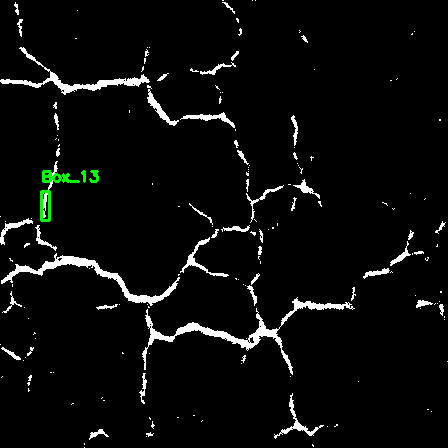

Box_13_Crack1:
Length: 77.11269783973694
Thickness: 0.8040180377148053
Region: [[[ 4  0]]

 [[ 4  2]]

 [[ 3  3]]

 [[ 2  2]]

 [[ 3  3]]

 [[ 3  7]]

 [[ 2  8]]

 [[ 2 10]]

 [[ 1 11]]

 [[ 1 14]]

 [[ 2 15]]

 [[ 2 17]]

 [[ 3 16]]

 [[ 4 17]]

 [[ 4 19]]

 [[ 3 20]]

 [[ 2 19]]

 [[ 1 19]]

 [[ 1 20]]

 [[ 0 21]]

 [[ 0 22]]

 [[ 1 23]]

 [[ 1 25]]

 [[ 0 26]]

 [[ 0 28]]

 [[ 2 28]]

 [[ 1 27]]

 [[ 2 26]]

 [[ 3 26]]

 [[ 4 25]]

 [[ 4 24]]

 [[ 3 23]]

 [[ 3 20]]

 [[ 4 19]]

 [[ 4 11]]

 [[ 5 10]]

 [[ 5  4]]

 [[ 6  3]]

 [[ 6  2]]

 [[ 7  1]]

 [[ 6  1]]

 [[ 5  0]]]


In [ ]:
# @title Randomly select a box on the segmentation output, then get the coordinates and crack_measurements details for futher inspection
# from google.colab.patches import cv2_imshow
# import cv2
# import numpy as np

# def detect_valid_cracks_rand(input_image_path):
#     # Load the output image
#     crack_image = cv2.imread(input_image_path, cv2.IMREAD_GRAYSCALE)

#     # Threshold the image to obtain a binary image
#     _, binary_image = cv2.threshold(crack_image, 127, 255, cv2.THRESH_BINARY)

#     # Find contours in the binary image
#     contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

#     # Draw bounding boxes and label them on a copy of the original image
#     image_with_boxes = cv2.cvtColor(crack_image, cv2.COLOR_GRAY2BGR)

#     # Dictionary to store measurements for each box
#     box_measurements = {}

#     # Filter contours based on length
#     valid_contours = [contour for contour in contours if len(contour) > 35]

#     # Check if there are any valid contours
#     if valid_contours:
#         # Generate a random index within the valid contour list's range
#         random_index = np.random.randint(0, len(valid_contours))

#         # Select the contour at the random index
#         random_contour = valid_contours[random_index]

#         # Get bounding box coordinates
#         x, y, w, h = cv2.boundingRect(random_contour)

#         # Draw the selected bounding box on the image
#         cv2.rectangle(image_with_boxes, (x, y), (x + w, y + h), (0, 255, 0), 2)
#         cv2.putText(image_with_boxes, f'Box_{random_index+1}', (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

#         # Get the region of interest (ROI) inside the bounding box
#         roi = binary_image[y:y+h, x:x+w]

#         # Find contours within the ROI
#         roi_contours, _ = cv2.findContours(roi, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

#         # Calculate length, thickness, and region for each crack line within the ROI
#         for j, roi_contour in enumerate(roi_contours):
#             length = cv2.arcLength(roi_contour, True)
#             area = cv2.contourArea(roi_contour)
#             perimeter = cv2.arcLength(roi_contour, True)
#             thickness = area / perimeter if perimeter > 0 else 0

#             # Only include measurements if length and thickness are non-zero
#             if length > 0 and thickness > 0:
#                 # Store measurements in the dictionary
#                 box_measurements[f'Box_{random_index+1}_Crack{j+1}'] = {
#                     'length': length,
#                     'thickness': thickness,
#                     'region': roi_contour
#                 }

#         # Print the bounding box coordinates
#         print("Bounding Box Coordinates (x, y, width, height):", x, y, w, h)

#     else:
#         print("No valid contours found.")

#     return image_with_boxes, box_measurements

# # Example usage
# input_image_path = '/content/drive/MyDrive/Road_surface_crack_detection/test_result/output_test-10.jpg'
# image_with_boxes, box_measurements = detect_valid_cracks_rand(input_image_path)

# # Display the image with the bounding box
# cv2_imshow(image_with_boxes)

# # Print detailed numerical information about the selected box
# for key, value in box_measurements.items():
#     print(f"{key}:")
#     print("Length:", value['length'])
#     print("Thickness:", value['thickness'])
#     print("Region:", value['region'])


In [ ]:
# @title find the length, min/max of x,y for plot ratio and double check the length from arcLength above

# Convert the list of coordinates to a NumPy array
region_array = np.array(region_coordinates)

# Compute the length of the contour
contour_length = cv2.arcLength(region_array, closed=True)

# Extract the region represented by the coordinates
# Here, you can use the region_array directly as it represents the contour
region_contour = region_array

print("Contour Length:", contour_length)


# Initialize minimum and maximum x and y values
min_x = min_y = float('inf')
max_x = max_y = float('-inf')

# Find the minimum and maximum x and y values
for point in region_coordinates:
    if len(point) == 1 and len(point[0]) == 2:  # Check if the point format is [[x, y]]
        x, y = point[0]  # Extract x and y coordinates from the sublist
        min_x = min(min_x, x)
        max_x = max(max_x, x)
        min_y = min(min_y, y)
        max_y = max(max_y, y)
    else:
        print("Invalid point format:", point)

# Print the limits
print("Minimum X:", min_x)
print("Maximum X:", max_x)
print("Minimum Y:", min_y)
print("Maximum Y:", max_y)

Contour Length: 77.11269783973694
Minimum X: 0
Maximum X: 7
Minimum Y: 0
Maximum Y: 28


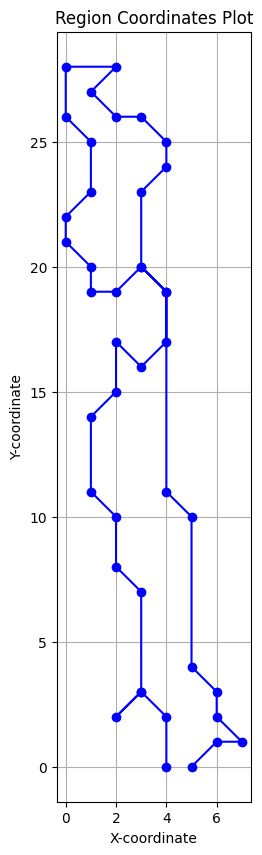

In [ ]:
# @title Using native matplot to plot the points, assuming the coordinates are extracted in sequential manner
import matplotlib.pyplot as plt

# List of numbers representing region coordinates
region_coordinates = [[[ 4,  0]], [[ 4,  2]], [[ 3,  3]], [[ 2,  2]], [[ 3,  3]], [[ 3,  7]], [[ 2,  8]], [[ 2, 10]],
                      [[ 1, 11]], [[ 1, 14]], [[ 2, 15]], [[ 2, 17]], [[ 3, 16]], [[ 4, 17]], [[ 4, 19]], [[ 3, 20]],
                      [[ 2, 19]], [[ 1, 19]], [[ 1, 20]], [[ 0, 21]], [[ 0, 22]], [[ 1, 23]], [[ 1, 25]], [[ 0, 26]],
                      [[ 0, 28]], [[ 2, 28]], [[ 1, 27]], [[ 2, 26]], [[ 3, 26]], [[ 4, 25]], [[ 4, 24]], [[ 3, 23]],
                      [[ 3, 20]], [[ 4, 19]], [[ 4, 11]], [[ 5, 10]], [[ 5,  4]], [[ 6,  3]], [[ 6,  2]], [[ 7,  1]],
                      [[ 6,  1]], [[ 5,  0]]]

# Extract x and y coordinates
x_coords = [coord[0][0] for coord in region_coordinates]
y_coords = [coord[0][1] for coord in region_coordinates]

# Plot the coordinates
plt.figure(figsize=(2.5, 10))
plt.plot(x_coords, y_coords, marker='o', color='blue')
plt.title('Region Coordinates Plot')
plt.xlabel('X-coordinate')
plt.ylabel('Y-coordinate')
plt.grid(True)
plt.show()

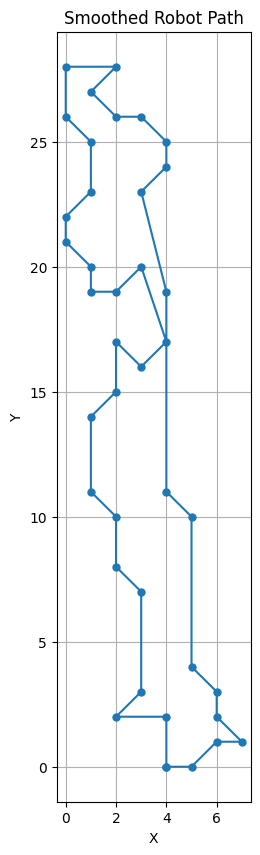

In [ ]:
# @title Using smooth_path() w/ closed shape to plot the coordinates from the crack, using KDTree algo

import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import KDTree

def smooth_path(coordinates):
    # Create a KDTree for efficient nearest neighbor search
    tree = KDTree(coordinates)

    # Find the nearest neighbor for each point
    nearest_neighbors = [tree.query(point)[1] for point in coordinates]

    # Remove duplicates (if any)
    unique_neighbors = list(set(nearest_neighbors))

    # Sort the unique neighbor indices
    unique_neighbors.sort()

    # Extract the unique points
    unique_points = [coordinates[idx] for idx in unique_neighbors]

    # Append the first point to the end to close the shape
    unique_points.append(unique_points[0])

    return unique_points


def plot_smoothed_path(coordinates):
    smoothed_path = smooth_path(coordinates)

    # Convert coordinates to NumPy array for easier manipulation
    smoothed_path = np.array(smoothed_path)

    # Plot the smoothed path
    plt.figure(figsize=(2.5, 10))
    plt.plot(smoothed_path[:, 0], smoothed_path[:, 1], marker='o', markersize=5, linestyle='-')
    plt.title('Smoothed Robot Path')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.grid(True)
    plt.show()

# Provided region_coordinates
region_coordinates = [[4, 0], [4, 2], [3, 3], [2, 2], [3, 3], [3, 7], [2, 8], [2, 10],
                      [1, 11], [1, 14], [2, 15], [2, 17], [3, 16], [4, 17], [4, 19], [3, 20],
                      [2, 19], [1, 19], [1, 20], [0, 21], [0, 22], [1, 23], [1, 25], [0, 26],
                      [0, 28], [2, 28], [1, 27], [2, 26], [3, 26], [4, 25], [4, 24], [3, 23],
                      [3, 20], [4, 19], [4, 11], [5, 10], [5, 4], [6, 3], [6, 2], [7, 1],
                      [6, 1], [5, 0]]

# Plot smoothed path
plot_smoothed_path(region_coordinates)


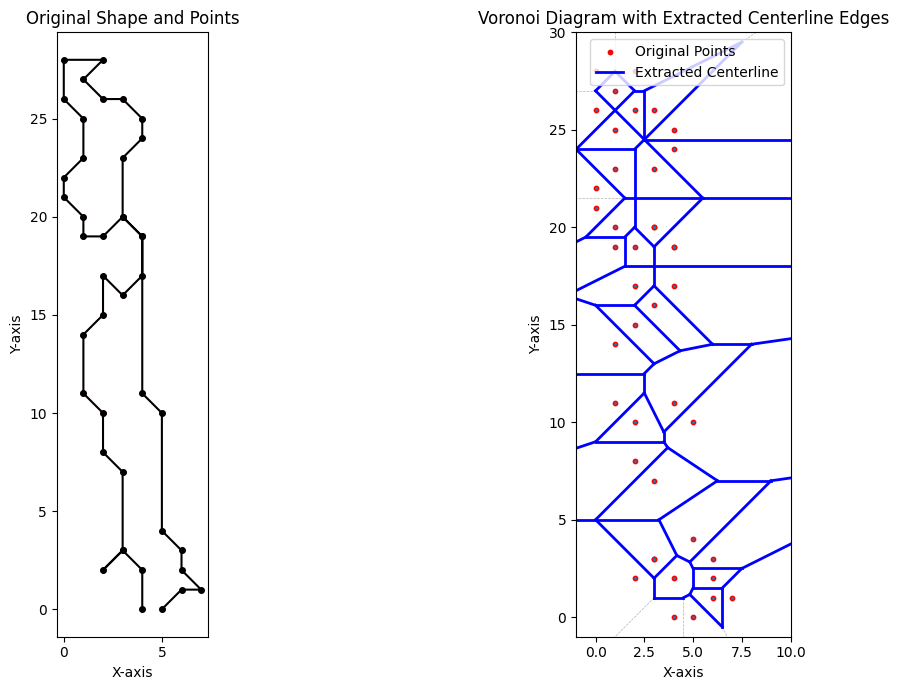

In [ ]:
# @title Plot the Voronoi graph to find the centerline
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import Voronoi, voronoi_plot_2d

def distance_to_line_segment(point, line_start, line_end):
    def distance_point_to_line(p, start, end):
        return np.linalg.norm(np.cross(end - start, start - p)) / np.linalg.norm(end - start)

    d1 = np.linalg.norm(np.array(point) - np.array(line_start))
    d2 = np.linalg.norm(np.array(point) - np.array(line_end))
    d3 = distance_point_to_line(np.array(point), np.array(line_start), np.array(line_end))

    return min(d1, d2, d3)

def find_path_inside_shape(coordinates):
    # Ensure the shape is closed
    coordinates.append(coordinates[0])

    # Convert coordinates to NumPy array
    coordinates = np.array(coordinates)

    # Initialize variables
    path = []

    # Start DFS from the first coordinate
    stack = [0]
    visited = set()

    while stack:
        node = stack.pop()
        path.append(node)
        visited.add(node)

        # Find neighboring nodes
        neighbors = [i for i in range(len(coordinates)) if i != node and i not in visited]
        stack.extend(neighbors[::-1])  # Reverse to maintain order

    # Convert node indices to coordinates
    path_coordinates = [coordinates[node] for node in path]

    return path_coordinates

# Given region coordinates
region_coordinates = [[4, 0], [4, 2], [3, 3], [2, 2], [3, 3], [3, 7], [2, 8], [2, 10],
                      [1, 11], [1, 14], [2, 15], [2, 17], [3, 16], [4, 17], [4, 19], [3, 20],
                      [2, 19], [1, 19], [1, 20], [0, 21], [0, 22], [1, 23], [1, 25], [0, 26],
                      [0, 28], [2, 28], [1, 27], [2, 26], [3, 26], [4, 25], [4, 24], [3, 23],
                      [3, 20], [4, 19], [4, 11], [5, 10], [5, 4], [6, 3], [6, 2], [7, 1],
                      [6, 1], [5, 0]]

# Convert to NumPy array
region_coordinates = np.array(region_coordinates)

# Find path inside shape
path_coordinates = find_path_inside_shape(region_coordinates.tolist())

# Plotting
fig, ax = plt.subplots(1, 2, figsize=(14, 7))

# Plot original shape and points
ax[0].plot(region_coordinates[:, 0], region_coordinates[:, 1], 'ko-', markersize=4)
ax[0].scatter(region_coordinates[:, 0], region_coordinates[:, 1], c='red', s=10)
ax[0].set_title('Original Shape and Points')
ax[0].set_xlabel('X-axis')
ax[0].set_ylabel('Y-axis')
ax[0].set_aspect('equal', adjustable='box')

# Create Voronoi diagram
vor = Voronoi(region_coordinates)

# Extract Voronoi edges
edges = []
for ridge_vertices in vor.ridge_vertices:
    if -1 not in ridge_vertices:
        start = vor.vertices[ridge_vertices[0]]
        end = vor.vertices[ridge_vertices[1]]
        edges.append((start, end))

# Plot Voronoi diagram with extracted centerline edges
voronoi_plot_2d(vor, ax=ax[1], show_vertices=False, line_colors='gray', line_width=0.5, line_alpha=0.6, point_size=2)
ax[1].scatter(region_coordinates[:, 0], region_coordinates[:, 1], c='red', s=10, label='Original Points')
for edge in edges:
    start, end = edge
    ax[1].plot([start[0], end[0]], [start[1], end[1]], 'b-', linewidth=2, label='Extracted Centerline' if 'Extracted Centerline' not in ax[1].get_legend_handles_labels()[1] else "")

ax[1].set_xlim(-1, 10)
ax[1].set_ylim(-1, 30)
ax[1].set_title('Voronoi Diagram with Extracted Centerline Edges')
ax[1].set_xlabel('X-axis')
ax[1].set_ylabel('Y-axis')
ax[1].set_aspect('equal', adjustable='box')
ax[1].legend()

plt.tight_layout()
plt.show()

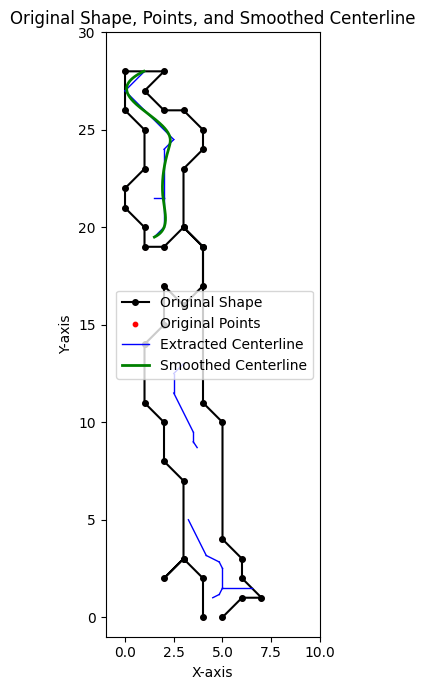

In [ ]:
# @title Based on the centerline, smooth it to make it more practical
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from scipy.spatial import Voronoi, voronoi_plot_2d
from scipy.spatial.distance import euclidean
from scipy.interpolate import splprep, splev
from shapely.geometry import LineString, Polygon

# Function to convert Voronoi edges to a tuple of points
def edge_to_tuple(edge):
    return (tuple(edge[0]), tuple(edge[1]))

# Given region coordinates
region_coordinates = [[4, 0], [4, 2], [3, 3], [2, 2], [3, 3], [3, 7], [2, 8], [2, 10],
                      [1, 11], [1, 14], [2, 15], [2, 17], [3, 16], [4, 17], [4, 19], [3, 20],
                      [2, 19], [1, 19], [1, 20], [0, 21], [0, 22], [1, 23], [1, 25], [0, 26],
                      [0, 28], [2, 28], [1, 27], [2, 26], [3, 26], [4, 25], [4, 24], [3, 23],
                      [3, 20], [4, 19], [4, 11], [5, 10], [5, 4], [6, 3], [6, 2], [7, 1],
                      [6, 1], [5, 0]]

# Convert to NumPy array
region_coordinates = np.array(region_coordinates)

# Create a Shapely polygon from region coordinates
polygon = Polygon(region_coordinates)

# Create Voronoi diagram
vor = Voronoi(region_coordinates)

# Extract Voronoi edges
edges = []
for ridge_vertices in vor.ridge_vertices:
    if -1 not in ridge_vertices:
        start = vor.vertices[ridge_vertices[0]]
        end = vor.vertices[ridge_vertices[1]]
        edges.append((start, end))

# Step 1: Simplify edges
simplified_edges = []
for edge in edges:
    start, end = edge
    if polygon.contains(LineString([start, end])):
        simplified_edges.append((start, end))

# Construct a graph from the simplified edges
G = nx.Graph()
for edge in simplified_edges:
    start, end = tuple(edge[0]), tuple(edge[1])
    distance = euclidean(start, end)
    G.add_edge(start, end, weight=distance)

# Step 2: Find the Longest Path (as a proxy for the central path)
farthest_points = max(nx.all_pairs_dijkstra_path_length(G), key=lambda x: max(x[1].values()))
start_point = farthest_points[0]
end_point = max(farthest_points[1], key=farthest_points[1].get)

longest_path = nx.dijkstra_path(G, source=start_point, target=end_point)

# Extract coordinates of the longest path
path_coords = np.array(longest_path)

# Step 3: Smooth the Path using Spline Interpolation
# Use a smaller 's' parameter to reduce over-smoothing
tck, u = splprep([path_coords[:, 0], path_coords[:, 1]], s=0.1)
unew = np.linspace(0, 1, num=200)
smoothed_path = np.array(splev(unew, tck)).T

# Plot original shape, original points, and smoothed path
fig, ax = plt.subplots(figsize=(10, 7))

# Plot original shape
ax.plot(region_coordinates[:, 0], region_coordinates[:, 1], 'ko-', markersize=4, label='Original Shape')
ax.scatter(region_coordinates[:, 0], region_coordinates[:, 1], c='red', s=10, label='Original Points')

# Plot extracted centerline edges
for edge in simplified_edges:
    start, end = edge
    ax.plot([start[0], end[0]], [start[1], end[1]], 'b-', linewidth=1, label='Extracted Centerline' if 'Extracted Centerline' not in ax.get_legend_handles_labels()[1] else "")

# Plot smoothed path
ax.plot(smoothed_path[:, 0], smoothed_path[:, 1], 'g-', linewidth=2, label='Smoothed Centerline')

ax.set_xlim(-1, 10)
ax.set_ylim(-1, 30)
ax.set_title('Original Shape, Points, and Smoothed Centerline')
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_aspect('equal', adjustable='box')
ax.legend()

plt.tight_layout()
plt.show()

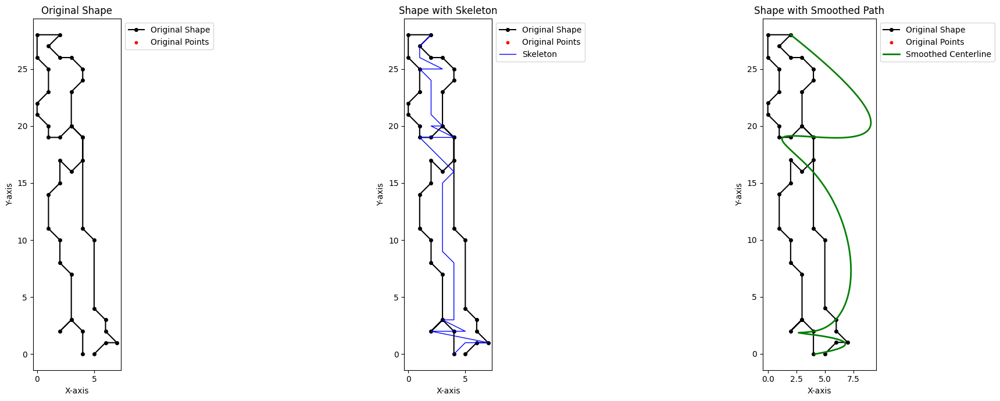

In [ ]:
# @title Getting skeleton and the smoothed guidline
import numpy as np
import matplotlib.pyplot as plt
from skimage.morphology import skeletonize
from skimage.draw import polygon
from scipy.interpolate import splprep, splev
from shapely.geometry import Polygon
from rdp import rdp

# Given region coordinates
region_coordinates = [[4, 0], [4, 2], [3, 3], [2, 2], [3, 3], [3, 7], [2, 8], [2, 10],
                      [1, 11], [1, 14], [2, 15], [2, 17], [3, 16], [4, 17], [4, 19], [3, 20],
                      [2, 19], [1, 19], [1, 20], [0, 21], [0, 22], [1, 23], [1, 25], [0, 26],
                      [0, 28], [2, 28], [1, 27], [2, 26], [3, 26], [4, 25], [4, 24], [3, 23],
                      [3, 20], [4, 19], [4, 11], [5, 10], [5, 4], [6, 3], [6, 2], [7, 1],
                      [6, 1], [5, 0]]

# Convert to NumPy array
region_coordinates = np.array(region_coordinates)

# Create a Shapely polygon from region coordinates
polygon_shape = Polygon(region_coordinates)

# Create a binary image of the shape
height, width = 30, 10  # Size of the image
img = np.zeros((height, width), dtype=np.uint8)
rr, cc = polygon(region_coordinates[:, 1], region_coordinates[:, 0], img.shape)
img[rr, cc] = 1

# Extract the skeleton
skeleton = skeletonize(img)

# Find the coordinates of the skeleton
skeleton_coords = np.column_stack(np.nonzero(skeleton))

# Optionally simplify the skeleton path using RDP
epsilon = 2.0  # Adjust the epsilon value as needed
simplified_skeleton_coords = rdp(skeleton_coords.tolist(), epsilon=epsilon)

# Convert the simplified skeleton coordinates to a NumPy array
simplified_skeleton_coords = np.array(simplified_skeleton_coords)

# Smooth the path using spline interpolation
tck, u = splprep([simplified_skeleton_coords[:, 1], simplified_skeleton_coords[:, 0]], s=1)
unew = np.linspace(0, 1, num=200)
smoothed_path = np.array(splev(unew, tck)).T

# Plot the original shape, skeleton, and smoothed path
fig, ax = plt.subplots(1, 3, figsize=(21, 7))

# Plot original shape
ax[0].plot(region_coordinates[:, 0], region_coordinates[:, 1], 'ko-', markersize=4, label='Original Shape')
ax[0].scatter(region_coordinates[:, 0], region_coordinates[:, 1], c='red', s=10, label='Original Points')
ax[0].set_title('Original Shape')
ax[0].set_xlabel('X-axis')
ax[0].set_ylabel('Y-axis')
ax[0].set_aspect('equal', adjustable='box')

# Plot shape with skeleton
ax[1].plot(region_coordinates[:, 0], region_coordinates[:, 1], 'ko-', markersize=4, label='Original Shape')
ax[1].scatter(region_coordinates[:, 0], region_coordinates[:, 1], c='red', s=10, label='Original Points')
ax[1].plot(skeleton_coords[:, 1], skeleton_coords[:, 0], 'b-', linewidth=1, label='Skeleton')
ax[1].set_title('Shape with Skeleton')
ax[1].set_xlabel('X-axis')
ax[1].set_ylabel('Y-axis')
ax[1].set_aspect('equal', adjustable='box')

# Plot shape with smoothed path
ax[2].plot(region_coordinates[:, 0], region_coordinates[:, 1], 'ko-', markersize=4, label='Original Shape')
ax[2].scatter(region_coordinates[:, 0], region_coordinates[:, 1], c='red', s=10, label='Original Points')
ax[2].plot(smoothed_path[:, 0], smoothed_path[:, 1], 'g-', linewidth=2, label='Smoothed Centerline')
ax[2].set_title('Shape with Smoothed Path')
ax[2].set_xlabel('X-axis')
ax[2].set_ylabel('Y-axis')
ax[2].set_aspect('equal', adjustable='box')

# Adjust legend position
ax[0].legend(loc='upper left', bbox_to_anchor=(1, 1))
ax[1].legend(loc='upper left', bbox_to_anchor=(1, 1))
ax[2].legend(loc='upper left', bbox_to_anchor=(1, 1))

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, filters, morphology
from skimage.morphology import skeletonize
from skimage.measure import label, regionprops
from scipy.spatial import distance_matrix
import networkx as nx

# Load the image
image_path = '/content/drive/MyDrive/Road_surface_crack_detection/test_result/Screenshot 2024-05-23 at 9.50.55 AM.png'
image = io.imread(image_path)

# Convert to grayscale
gray = color.rgb2gray(image)

# Threshold the image to get a binary image
threshold_value = filters.threshold_otsu(gray)
binary = gray > threshold_value

# Apply morphological operations to clean up the binary image
binary_cleaned = morphology.remove_small_objects(binary, min_size=64)
binary_cleaned = morphology.remove_small_holes(binary_cleaned, area_threshold=64)

# Extract the skeleton
skeleton = skeletonize(binary_cleaned)

# Find connected components in the skeleton
labeled_skeleton = label(skeleton)
regions = regionprops(labeled_skeleton)

# Function to find the longest path in a skeleton region
def find_longest_path(region):
    coords = region.coords
    if len(coords) < 2:
        return []
    dist_matrix = distance_matrix(coords, coords)
    G = nx.Graph()
    for i in range(len(coords)):
        for j in range(i + 1, len(coords)):
            G.add_edge(i, j, weight=dist_matrix[i, j])
    start_node = max(G.nodes, key=lambda n: nx.eccentricity(G, v=n))
    end_node = max(nx.single_source_shortest_path_length(G, start_node).items(), key=lambda x: x[1])[0]
    path = nx.shortest_path(G, start_node, end_node, weight='weight')
    return [coords[i] for i in path]

# Find the longest paths in all skeleton regions
paths = [find_longest_path(region) for region in regions]

# Plot the original image and the longest paths
fig, ax = plt.subplots(1, 2, figsize=(15, 7))

# Original image
ax[0].imshow(image)
ax[0].set_title('Original Image')
ax[0].axis('off')

# Longest paths on the skeleton
ax[1].imshow(image)
for path in paths:
    if len(path) > 1:  # Only plot paths with sufficient length
        path = np.array(path)
        ax[1].plot(path[:, 1], path[:, 0], 'r-', linewidth=2)
ax[1].set_title('Longest Paths on Skeleton')
ax[1].axis('off')

plt.tight_layout()
plt.show()

ValueError: the input array must have size 3 along `channel_axis`, got (210, 98, 4)

#### Using A* on Voronoi Graph to get the optimal guidance line, fail to get the optimal path.

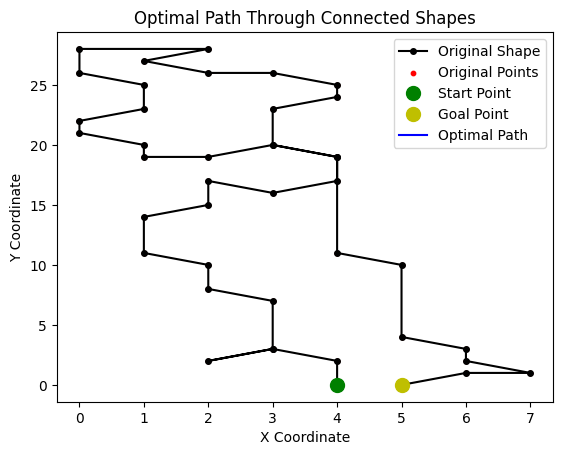

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import Voronoi
from sklearn.neighbors import KDTree

class Node:
    def __init__(self, index, coordinates):
        self.index = index
        self.coordinates = coordinates
        self.g_cost = np.inf
        self.h_cost = np.inf
        self.f_cost = np.inf
        self.parent = None
        self.neighbors = []

    def __eq__(self, other):
        return self.index == other.index

    def __hash__(self):
        return hash(self.index)

def euclidean_distance(point1, point2):
    return np.linalg.norm(np.array(point1) - np.array(point2))

def reconstruct_path(current_node):
    path = []
    while current_node is not None:
        path.append(current_node.coordinates)
        current_node = current_node.parent
    return path[::-1]

def astar_search(graph, start_idx, goal_idx):
    open_set = set()
    closed_set = set()

    start_node = graph[start_idx]
    start_node.g_cost = 0
    start_node.h_cost = euclidean_distance(start_node.coordinates, graph[goal_idx].coordinates)
    start_node.f_cost = start_node.g_cost + start_node.h_cost

    open_set.add(start_node)

    while open_set:
        current_node = min(open_set, key=lambda node: node.f_cost)

        if current_node.index == goal_idx:
            return reconstruct_path(current_node)

        open_set.remove(current_node)
        closed_set.add(current_node)

        for neighbor_idx in graph[current_node.index].neighbors:
            neighbor_node = graph[neighbor_idx]
            if neighbor_node in closed_set:
                continue

            tentative_g_cost = current_node.g_cost + euclidean_distance(current_node.coordinates, neighbor_node.coordinates)

            if tentative_g_cost < neighbor_node.g_cost:
                neighbor_node.parent = current_node
                neighbor_node.g_cost = tentative_g_cost
                neighbor_node.h_cost = euclidean_distance(neighbor_node.coordinates, graph[goal_idx].coordinates)
                neighbor_node.f_cost = neighbor_node.g_cost + neighbor_node.h_cost

                if neighbor_node not in open_set:
                    open_set.add(neighbor_node)

    return None

# Create Voronoi diagram from coordinates
region_coordinates = np.array([[4, 0], [4, 2], [3, 3], [2, 2], [3, 3], [3, 7], [2, 8], [2, 10],
                               [1, 11], [1, 14], [2, 15], [2, 17], [3, 16], [4, 17], [4, 19], [3, 20],
                               [2, 19], [1, 19], [1, 20], [0, 21], [0, 22], [1, 23], [1, 25], [0, 26],
                               [0, 28], [2, 28], [1, 27], [2, 26], [3, 26], [4, 25], [4, 24], [3, 23],
                               [3, 20], [4, 19], [4, 11], [5, 10], [5, 4], [6, 3], [6, 2], [7, 1],
                               [6, 1], [5, 0]])
vor = Voronoi(region_coordinates)

# Extract Voronoi vertices
vertices = vor.vertices

# Build KDTree for efficient nearest neighbor search
tree = KDTree(vertices)

# Define start and goal points
start_point = (4, 0)
goal_point = (5, 0)

# Find nearest vertices to start and goal points
start_idx = tree.query([start_point], return_distance=False)[0][0]
goal_idx = tree.query([goal_point], return_distance=False)[0][0]

# Define graph nodes
graph = [Node(i, vertex) for i, vertex in enumerate(vertices)]

# Populate neighbors for each node
for ridge_points in vor.ridge_vertices:
    if -1 in ridge_points:
        continue
    node_idx1, node_idx2 = ridge_points
    graph[node_idx1].neighbors.append(node_idx2)
    graph[node_idx2].neighbors.append(node_idx1)

# Perform A* search
optimal_path = astar_search(graph, start_idx, goal_idx)

# Plot the original shape and points
fig, ax = plt.subplots()

# Plot the original coordinates and lines connecting them to visualize the shape
ax.plot(region_coordinates[:, 0], region_coordinates[:, 1], 'ko-', markersize=4, label='Original Shape')
ax.scatter(region_coordinates[:, 0], region_coordinates[:, 1], c='red', s=10, label='Original Points')

# Plot start and goal points
ax.plot(start_point[0], start_point[1], 'go', markersize=10, label='Start Point')
ax.plot(goal_point[0], goal_point[1], 'yo', markersize=10, label='Goal Point')

# Plot optimal path if found
if optimal_path:
    optimal_path_x = [point[0] for point in optimal_path]
    optimal_path_y = [point[1] for point in optimal_path]
    ax.plot(optimal_path_x, optimal_path_y, 'b-', label='Optimal Path')

# Add legend
ax.legend()

# Show plot
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.title('Optimal Path Through Connected Shapes')
plt.show()

### Getting the centerline from the segmented image itself with the help of computer vision techniques.

In [ ]:
image = cv2.imread('/content/drive/MyDrive/Road_surface_crack_detection/test_result/Screenshot 2024-05-23 at 9.50.55 AM.png')

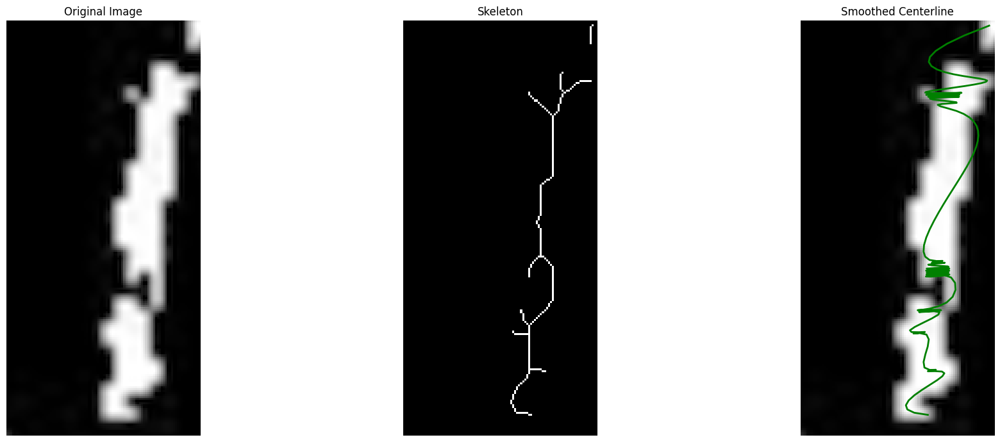

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, filters, morphology
from skimage.morphology import skeletonize
from scipy.interpolate import splprep, splev
from rdp import rdp

# Load the image
image_path = '/content/drive/MyDrive/Road_surface_crack_detection/test_result/Screenshot 2024-05-23 at 9.50.55 AM.png'  # Update with the correct path
image = io.imread(image_path)

# Ensure the image has 3 channels (RGB) by checking its shape
if len(image.shape) == 2:
    # Image is already in grayscale
    gray = image
elif image.shape[2] == 4:
    # Image has an alpha channel (RGBA), discard it
    image = image[:, :, :3]
    gray = color.rgb2gray(image)
elif image.shape[2] == 3:
    # Image is already in RGB
    gray = color.rgb2gray(image)
else:
    raise ValueError(f"Unexpected image shape: {image.shape}")

# Threshold the image to get a binary image
threshold_value = filters.threshold_otsu(gray)
binary = gray > threshold_value

# Apply morphological operations to clean up the binary image
binary_cleaned = morphology.remove_small_objects(binary, min_size=64)
binary_cleaned = morphology.remove_small_holes(binary_cleaned, area_threshold=64)

# Extract the skeleton
skeleton = skeletonize(binary_cleaned)

# Find the coordinates of the skeleton
skeleton_coords = np.column_stack(np.nonzero(skeleton))

# Simplify the skeleton path using RDP with a higher epsilon value
epsilon = 5.0  # Adjust the epsilon value as needed
simplified_skeleton_coords = rdp(skeleton_coords.tolist(), epsilon=epsilon)

# Convert the simplified skeleton coordinates to a NumPy array
simplified_skeleton_coords = np.array(simplified_skeleton_coords)

# Smooth the path using spline interpolation
tck, u = splprep([simplified_skeleton_coords[:, 1], simplified_skeleton_coords[:, 0]], s=2)
unew = np.linspace(0, 1, num=200)
smoothed_path = np.array(splev(unew, tck)).T

# Plot the original shape, skeleton, and smoothed path
fig, ax = plt.subplots(1, 3, figsize=(21, 7))

# Plot original shape
ax[0].imshow(image)
ax[0].set_title('Original Image')
ax[0].axis('off')

# Plot skeleton
ax[1].imshow(skeleton, cmap='gray')
ax[1].set_title('Skeleton')
ax[1].axis('off')

# Plot smoothed path
ax[2].imshow(image)
ax[2].plot(smoothed_path[:, 0], smoothed_path[:, 1], 'g-', linewidth=2, label='Smoothed Centerline')
ax[2].set_title('Smoothed Centerline')
ax[2].axis('off')

plt.tight_layout()
plt.show()

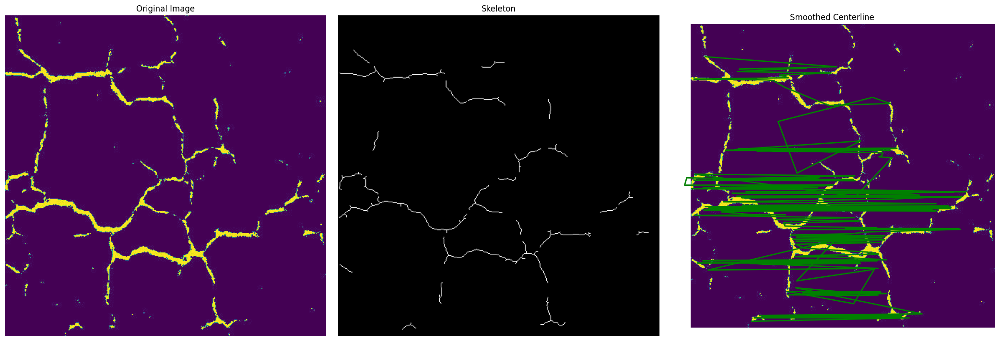

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, filters, morphology
from skimage.morphology import skeletonize
from scipy.interpolate import splprep, splev
from rdp import rdp

# Load the image
image_path = '/content/drive/MyDrive/Road_surface_crack_detection/test_result/output_test-10.jpg'
image = io.imread(image_path)

# Ensure the image has 3 channels (RGB) by checking its shape
if len(image.shape) == 2:
    # Image is already in grayscale
    gray = image
elif image.shape[2] == 4:
    # Image has an alpha channel (RGBA), discard it
    image = image[:, :, :3]
    gray = color.rgb2gray(image)
elif image.shape[2] == 3:
    # Image is already in RGB
    gray = color.rgb2gray(image)
else:
    raise ValueError(f"Unexpected image shape: {image.shape}")

# Threshold the image to get a binary image
threshold_value = filters.threshold_otsu(gray)
binary = gray > threshold_value

# Apply morphological operations to clean up the binary image
binary_cleaned = morphology.remove_small_objects(binary, min_size=64)
binary_cleaned = morphology.remove_small_holes(binary_cleaned, area_threshold=64)

# Extract the skeleton
skeleton = skeletonize(binary_cleaned)

# Find the coordinates of the skeleton
skeleton_coords = np.column_stack(np.nonzero(skeleton))

# Simplify the skeleton path using RDP with a higher epsilon value
epsilon = 5.0  # Adjust the epsilon value as needed
simplified_skeleton_coords = rdp(skeleton_coords.tolist(), epsilon=epsilon)

# Convert the simplified skeleton coordinates to a NumPy array
simplified_skeleton_coords = np.array(simplified_skeleton_coords)

# Smooth the path using spline interpolation
tck, u = splprep([simplified_skeleton_coords[:, 1], simplified_skeleton_coords[:, 0]], s=10)
unew = np.linspace(0, 1, num=200)
smoothed_path = np.array(splev(unew, tck)).T

# Plot the original shape, skeleton, and smoothed path
fig, ax = plt.subplots(1, 3, figsize=(21, 7))

# Plot original shape
ax[0].imshow(image)
ax[0].set_title('Original Image')
ax[0].axis('off')

# Plot skeleton
ax[1].imshow(skeleton, cmap='gray')
ax[1].set_title('Skeleton')
ax[1].axis('off')

# Plot smoothed path
ax[2].imshow(image)
ax[2].plot(smoothed_path[:, 0], smoothed_path[:, 1], 'g-', linewidth=2, label='Smoothed Centerline')
ax[2].set_title('Smoothed Centerline')
ax[2].axis('off')

plt.tight_layout()
plt.show()

Not enough points inside the boundary, using original path coordinates.


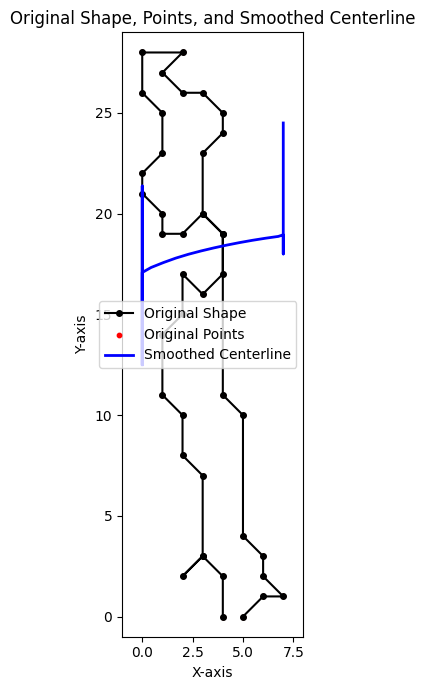

In [ ]:
# @title Additional one more smoothing on the previous result, aiming to limit the out of boundary and excessive curving issues
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from scipy.spatial.distance import euclidean
from scipy.interpolate import splprep, splev
from shapely.geometry import Point, Polygon

# Define your edges and region_coordinates here
# edges = ...
# region_coordinates = ...

# Step 1: Construct a Graph from the Voronoi Vertices and Edges
G = nx.Graph()
for edge in edges:
    start, end = edge
    distance = euclidean(start, end)
    G.add_edge(tuple(start), tuple(end), weight=distance)

# Step 2: Find the Longest Path (as a proxy for the central path)
farthest_points = max(nx.all_pairs_dijkstra_path_length(G), key=lambda x: max(x[1].values()))
start_point = farthest_points[0]
end_point = max(farthest_points[1], key=farthest_points[1].get)

longest_path = nx.dijkstra_path(G, source=start_point, target=end_point)

# Extract coordinates of the longest path
path_coords = np.array(longest_path)

# Create a polygon from the region coordinates
polygon = Polygon(region_coordinates)

# Filter path coordinates to keep only those inside the polygon
filtered_path_coords = [point for point in path_coords if polygon.contains(Point(point))]
filtered_path_coords = np.array(filtered_path_coords)

# Check if there are enough points after filtering
if len(filtered_path_coords) < 2:
    print("Not enough points inside the boundary, using original path coordinates.")
    filtered_path_coords = path_coords

# Step 3: Smooth the Path using Spline Interpolation with constraints
tck, u = splprep([filtered_path_coords[:, 0], filtered_path_coords[:, 1]], s=0.1)  # Adjusted smoothing factor
unew = np.linspace(0, 1, num=200)
smoothed_path = np.array(splev(unew, tck)).T

# Apply bounding box constraints to ensure the smoothed path stays within the original shape
min_x, min_y = np.min(region_coordinates, axis=0)
max_x, max_y = np.max(region_coordinates, axis=0)

smoothed_path[:, 0] = np.clip(smoothed_path[:, 0], min_x, max_x)
smoothed_path[:, 1] = np.clip(smoothed_path[:, 1], min_y, max_y)

# Plot original shape, original points, and smoothed path
fig, ax = plt.subplots(figsize=(10, 7))
ax.plot(region_coordinates[:, 0], region_coordinates[:, 1], 'ko-', markersize=4, label='Original Shape')
ax.scatter(region_coordinates[:, 0], region_coordinates[:, 1], c='red', s=10, label='Original Points')
ax.plot(smoothed_path[:, 0], smoothed_path[:, 1], 'b-', linewidth=2, label='Smoothed Centerline')
ax.set_xlim(min(region_coordinates[:, 0])-1, max(region_coordinates[:, 0])+1)
ax.set_ylim(min(region_coordinates[:, 1])-1, max(region_coordinates[:, 1])+1)
ax.set_title('Original Shape, Points, and Smoothed Centerline')
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_aspect('equal', adjustable='box')
ax.legend()
plt.tight_layout()
plt.show()

### Using the Github centerline extraction method to try and get the path

In [ ]:
! git clone https://github.com/ungarj/label_centerlines.git
%cd label_centerlines
! pip install -r requirements.txt
! python setup.py install

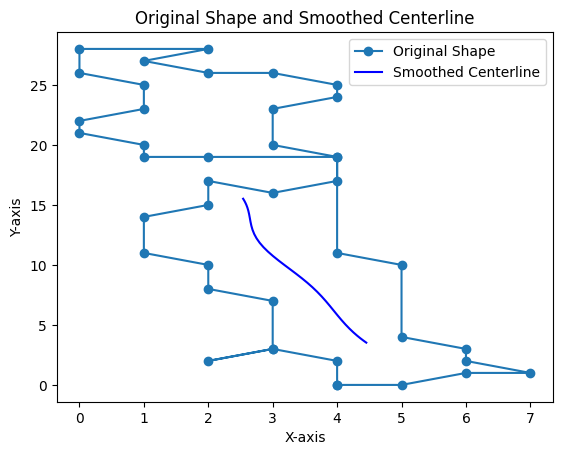

In [ ]:
from shapely.geometry import Polygon
from label_centerlines import get_centerline
import matplotlib.pyplot as plt


# Create a Shapely Polygon
polygon = Polygon(region_coordinates)

# Get the centerline
centerline = get_centerline(polygon, smooth_sigma=5)

# Plot the original shape and the centerline
x, y = polygon.exterior.xy
cx, cy = centerline.xy

fig, ax = plt.subplots()
ax.plot(x, y, 'o-', label='Original Shape')
ax.plot(cx, cy, 'b-', label='Smoothed Centerline')
ax.set_title('Original Shape and Smoothed Centerline')
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.legend()
plt.show()

  Preparing metadata (setup.py) ... done
  Created wheel for rdp: filename=rdp-0.8-py3-none-any.whl size=4586 sha256=93b6f4f80ff567eb1b7b1d980ecdd53465525a294f5cfd8ad559f37b1d831aa6
  Stored in directory: /root/.cache/pip/wheels/5d/12/ec/0fc50553af000b9c3d2c74b9f77a01ae4bfe856e9917ac239c
Successfully built rdp


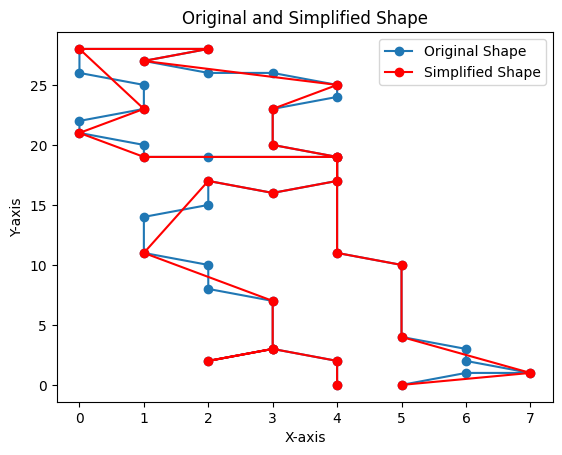

In [ ]:
# ! pip install rdp
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import Polygon, LineString
from rdp import rdp
from label_centerlines import get_centerline



# Simplify the polygon using the RDP algorithm
epsilon = 0.5  # Adjust the epsilon parameter for simplification
simplified_coords = rdp(region_coordinates, epsilon=epsilon)

# Create a Shapely Polygon from the simplified coordinates
simplified_polygon = Polygon(simplified_coords)

# Plot the original and simplified polygons
fig, ax = plt.subplots()
ax.plot(region_coordinates[:, 0], region_coordinates[:, 1], 'o-', label='Original Shape')
ax.plot(simplified_coords[:, 0], simplified_coords[:, 1], 'ro-', label='Simplified Shape')
ax.set_title('Original and Simplified Shape')
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.legend()
plt.show()

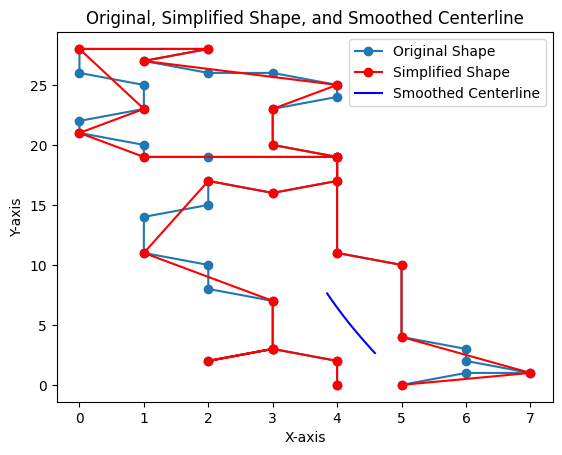

In [ ]:
# Get the centerline with adjusted parameters
centerline = get_centerline(simplified_polygon, smooth_sigma=10, max_paths=10)

# Extract coordinates for plotting
x, y = simplified_polygon.exterior.xy
cx, cy = centerline.xy

# Plot the original shape, simplified shape, and the centerline
fig, ax = plt.subplots()
ax.plot(region_coordinates[:, 0], region_coordinates[:, 1], 'o-', label='Original Shape')
ax.plot(simplified_coords[:, 0], simplified_coords[:, 1], 'ro-', label='Simplified Shape')
ax.plot(cx, cy, 'b-', label='Smoothed Centerline')
ax.set_title('Original, Simplified Shape, and Smoothed Centerline')
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.legend()
plt.show()

#### Using Worm Analysis

In [ ]:
! git clone https://github.com/gabyx/WormAnalysis.git
%cd WormAnalysis


Cloning into 'WormAnalysis'...
remote: Enumerating objects: 54, done.
remote: Total 54 (delta 0), reused 0 (delta 0), pack-reused 54
Receiving objects: 100% (54/54), 2.60 MiB | 21.64 MiB/s, done.
Resolving deltas: 100% (19/19), done.
/content/WormAnalysis


In [ ]:
%ls

commonFunctions.py


In [ ]:
%cd modules/

/content/WormAnalysis/modules


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import Polygon, LineString
from WormAnalysis import centerline_extraction

# Create a Shapely Polygon
polygon = Polygon(region_coordinates)

# Extract the centerline using WormAnalysis tools
centerline = centerline_extraction.get_centerline(polygon, smooth_sigma=10, max_paths=10)

# Extract coordinates for plotting
x, y = polygon.exterior.xy
cx, cy = centerline.xy

# Plot the original shape and the centerline
fig, ax = plt.subplots()
ax.plot(x, y, 'o-', label='Original Shape')
ax.plot(cx, cy, 'b-', label='Smoothed Centerline')
ax.set_title('Original Shape and Smoothed Centerline')
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.legend()
plt.show()

ImportError: cannot import name 'centerline_extraction' from 'WormAnalysis' (unknown location)

### Plot the entire crack using coordinates extracted and matplot with RDP algo

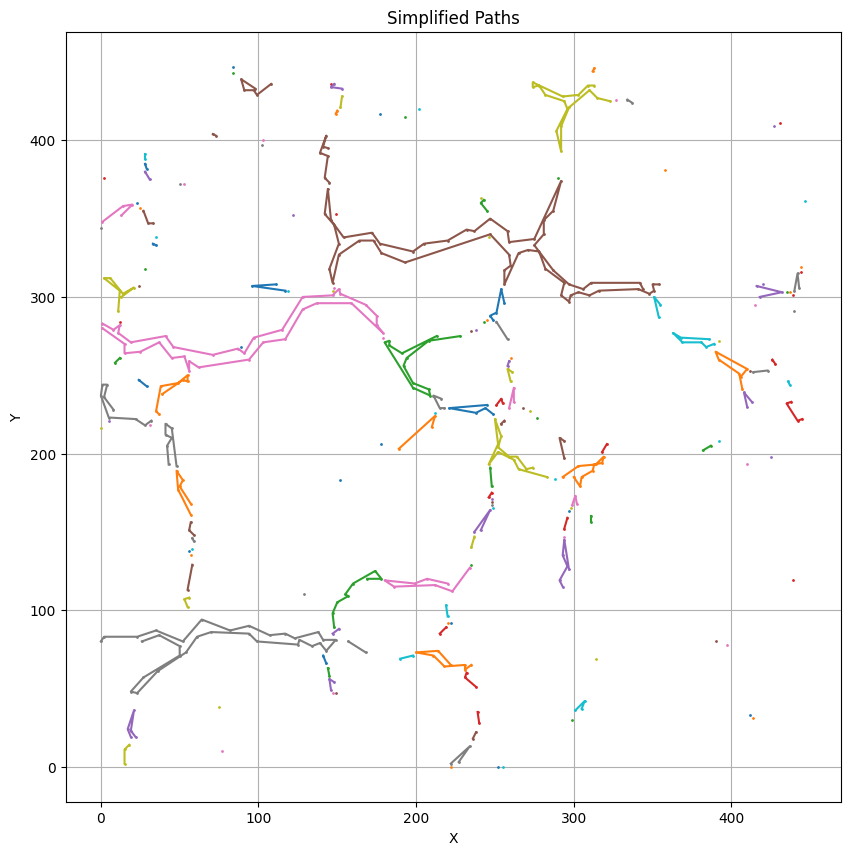

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image_path = '/content/drive/MyDrive/Road_surface_crack_detection/test_result/output_test-10.jpg'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Threshold the image to get binary image
_, binary_image = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)

# Find contours
contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Function to simplify contours using the Douglas-Peucker algorithm
def simplify_contours(contours, epsilon=1.0):
    simplified_contours = []
    for contour in contours:
        approx = cv2.approxPolyDP(contour, epsilon, True)
        simplified_contours.append(approx)
    return simplified_contours

# Simplify the contours
simplified_contours = simplify_contours(contours, epsilon=2.0)

# Plot the simplified paths
plt.figure(figsize=(10, 10))
for contour in simplified_contours:
    contour = contour.reshape(-1, 2)  # Reshape for plotting
    plt.plot(contour[:, 0], contour[:, 1], marker='o', markersize=1, linestyle='-')
plt.title('Simplified Paths')
plt.xlabel('X')
plt.ylabel('Y')
plt.grid(True)
plt.show()

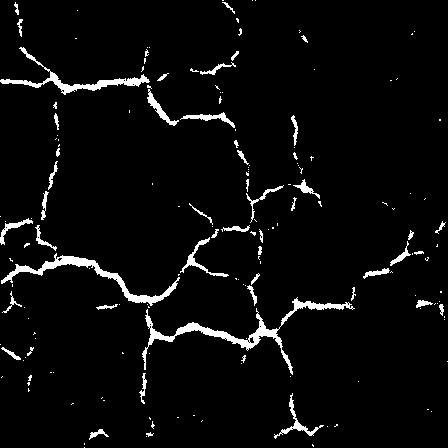

In [ ]:
from PIL import Image
Image.open('/content/drive/MyDrive/Road_surface_crack_detection/test_result/output_test-10.jpg')

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-38-ec94b3080851>:66: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "o-" (-> linestyle='-'). The keyword argument will take precedence.
  plt.plot(tsp_coordinates[:, 0], tsp_coordinates[:, 1], 'o-', color='green', markersize=5, linestyle='-', linewidth=2, label='Optimized Path')


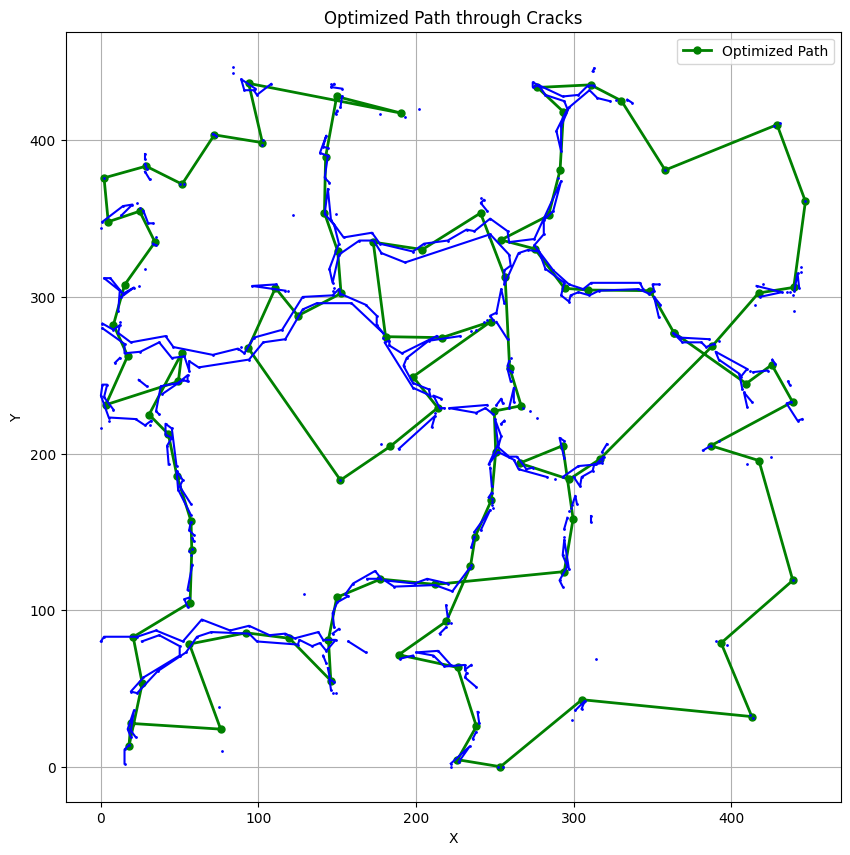

In [ ]:
# @title RDP algo + K-means Clustering + TSP
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import distance_matrix
from sklearn.cluster import KMeans
import networkx as nx
from networkx.algorithms.approximation import traveling_salesman_problem

# Load the image
image_path = '/content/drive/MyDrive/Road_surface_crack_detection/test_result/output_test-10.jpg'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Threshold the image to get binary image
_, binary_image = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)

# Find contours
contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Function to simplify contours using the Douglas-Peucker algorithm
def simplify_contours(contours, epsilon=1.0):
    simplified_contours = []
    for contour in contours:
        approx = cv2.approxPolyDP(contour, epsilon, True)
        simplified_contours.append(approx)
    return simplified_contours

# Simplify the contours
simplified_contours = simplify_contours(contours, epsilon=2.0)

# Extract key points from simplified contours
key_points = []
for contour in simplified_contours:
    for point in contour:
        key_points.append(point[0])

key_points = np.array(key_points)

if len(key_points) < 2:
    print("Not enough points to construct a path.")
else:
    key_points = key_points.reshape(-1, 2)  # Ensure key_points is a 2D array

    # Cluster the points to reduce the number of points
    num_clusters = 100  # Adjust this parameter as needed
    kmeans = KMeans(n_clusters=num_clusters, random_state=0).fit(key_points)
    cluster_centers = kmeans.cluster_centers_

    # Construct a complete graph with the cluster centers
    G = nx.complete_graph(len(cluster_centers))

    # Add distances as edge weights
    dist_matrix = distance_matrix(cluster_centers, cluster_centers)
    for i in range(len(cluster_centers)):
        for j in range(i + 1, len(cluster_centers)):
            G.add_edge(i, j, weight=dist_matrix[i, j])

    # Solve the TSP
    tsp_path = traveling_salesman_problem(G, weight='weight')

    # Extract the coordinates of the TSP path
    tsp_coordinates = cluster_centers[tsp_path]

    # Plot the TSP path
    plt.figure(figsize=(10, 10))
    plt.plot(tsp_coordinates[:, 0], tsp_coordinates[:, 1], 'o-', color='green', markersize=5, linestyle='-', linewidth=2, label='Optimized Path')
    for contour in simplified_contours:
        contour = contour.reshape(-1, 2)  # Reshape for plotting
        plt.plot(contour[:, 0], contour[:, 1], color='blue', marker='o', markersize=1, linestyle='-')
    plt.title('Optimized Path through Cracks')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.grid(True)
    plt.legend()
    plt.show()

### Summarize of what have done so far that made this plot possible.
- Image Preprocessing (Grayscel + binarized)
- Contour Extraction
- Contour Simplification (Douglas-Peucker Algorithm)
  - Epsilon parameter controls the levl of simplification
- Key Points Extraction -> Clustering Key Points (K-means)
- Graph Construction:
  - Each cluster centroid is a node, and each pair of nodes is connected by an edge
  - Weight of the edge is Euclidean distance
- Solve the Traveling Salesman Problem (TSP)
- Path Plotting:
  - Blue lines: Simplified crack edges
  - Green lines & dots: Optimized routes

# May 24 task list:
- De-noise the segmentation image to improve the path performance
- Find the width of each key points to determine the pressure of the pump

### De-noise

In [ ]:
import matplotlib.pyplot as plt
from skimage import io, filters, morphology
import numpy as np

def denoise_image(input_path, output_path, selem_radius=2):
    # Load the image
    image = io.imread(input_path, as_gray=True)

    # Threshold the image to get a binary image
    binary = image > filters.threshold_otsu(image)

    # Define a structuring element for morphology operations
    selem = morphology.disk(radius=selem_radius)

    # Perform morphological opening to remove small white dots (noise)
    denoised_binary = morphology.opening(binary, selem)

    # Perform morphological closing to fill gaps in the main lines
    denoised_binary = morphology.closing(denoised_binary, selem)

    # Save the denoised image
    io.imsave(output_path, denoised_binary.astype(np.uint8) * 255)

    # Plot the original and denoised images for comparison
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(binary, cmap='gray')
    axes[0].set_title('Original Binary Image')
    axes[1].imshow(denoised_binary, cmap='gray')
    axes[1].set_title('Denoised Binary Image')
    plt.show()


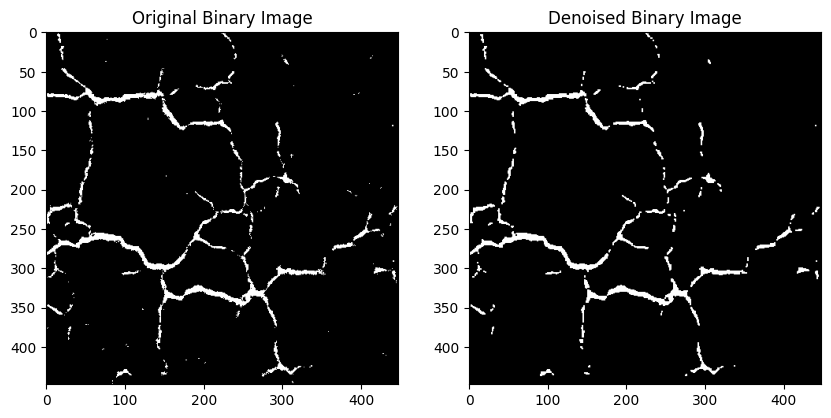

In [ ]:
# Example usage:

input_path = '/content/drive/MyDrive/Road_surface_crack_detection/test_result/output_test-10.jpg'
output_path = '/content/drive/MyDrive/Road_surface_crack_detection/denoised_result/output_test-10_denoised_1.4.jpg'
denoise_image(input_path, output_path, selem_radius=1.4)

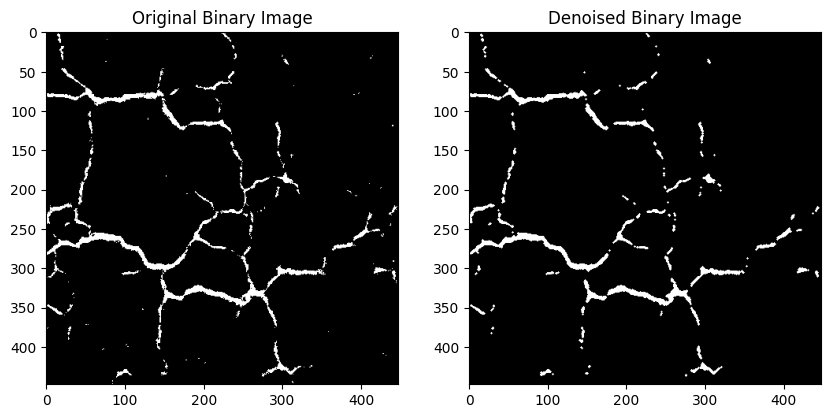

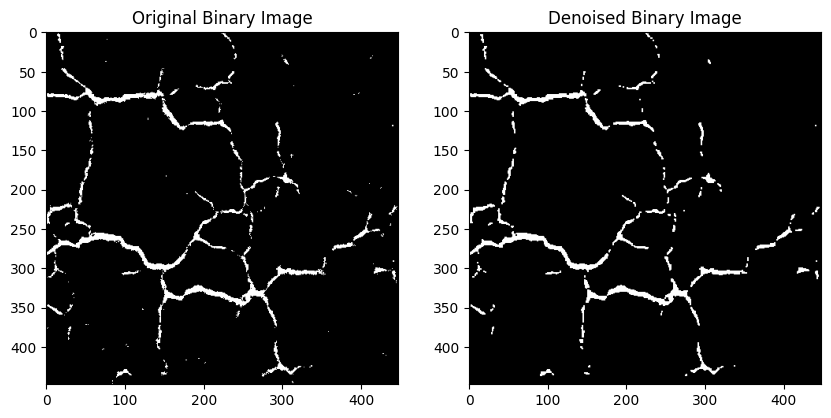

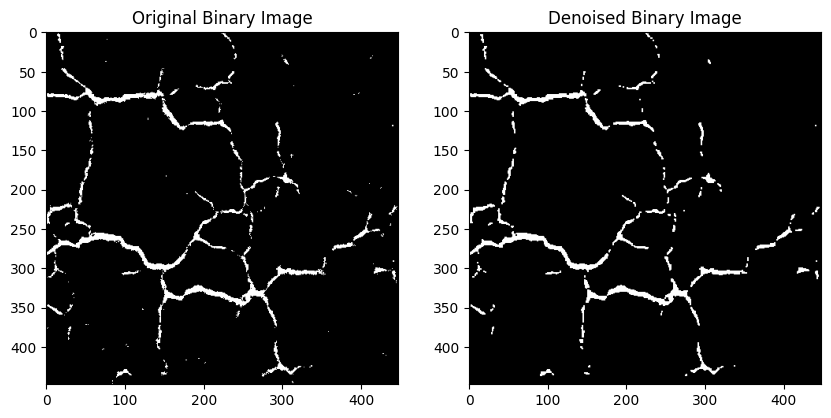

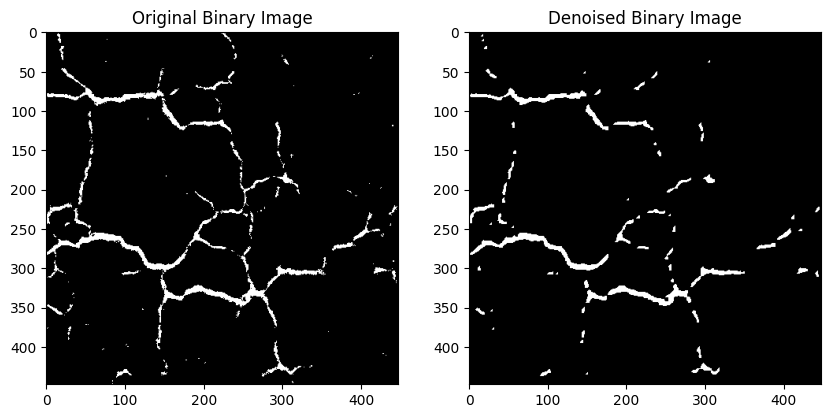

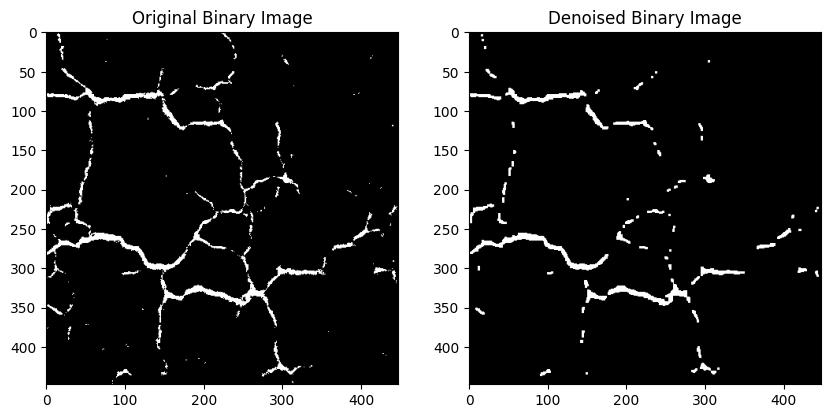

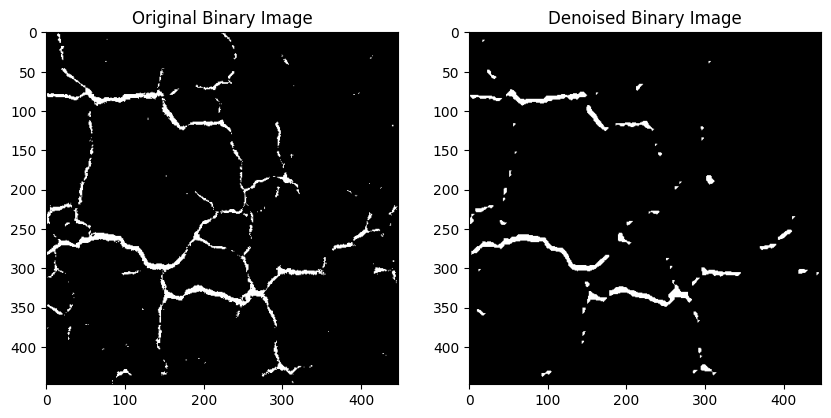

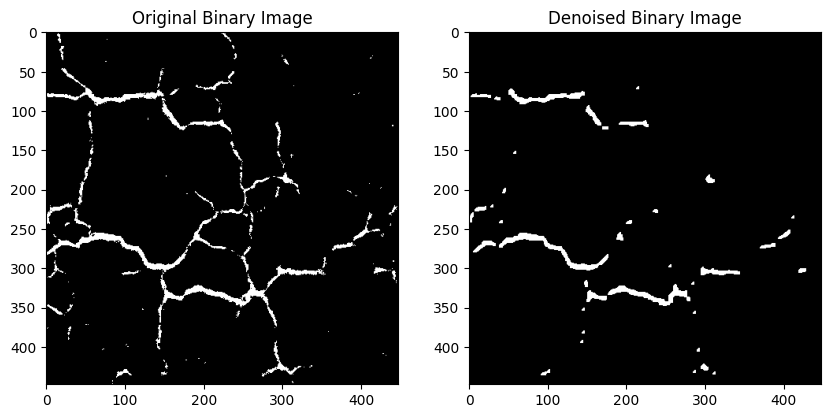

Denoising with various selem radii completed. Check the output folder for results.


In [ ]:
# @title see which selem_radius is the right balance, 1.4 seems to be the best here
import matplotlib.pyplot as plt
from skimage import io, filters, morphology
import numpy as np

def denoise_image_trials(input_path, output_path, selem_radius):
    """
    Denoises a grayscale image using morphological opening and closing.

    Args:
        input_path (str): Path to the input grayscale image.
        output_path (str): Path to save the denoised image.
        selem_radius (float): Radius of the structuring element for morphology.

    Returns:
        None
    """

    # Load the image
    image = io.imread(input_path, as_gray=True)

    # Threshold the image to get a binary image
    binary = image > filters.threshold_otsu(image)

    # Define a structuring element
    selem = morphology.disk(radius=selem_radius)

    # Perform morphological opening to remove small white dots (noise)
    denoised_binary = morphology.opening(binary, selem)

    # Perform morphological closing to fill gaps in the main lines
    denoised_binary = morphology.closing(denoised_binary, selem)

    # Save the denoised image with formatted filename
    # output_filename = f"{output_path[:-4]}_{selem_radius:.1f}_denoised.jpg"
    # io.imsave(output_filename, denoised_binary.astype(np.uint8) * 255)

    # Plot the original and denoised images (optional)
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(binary, cmap='gray')
    axes[0].set_title('Original Binary Image')
    axes[1].imshow(denoised_binary, cmap='gray')
    axes[1].set_title(f'Denoised Binary Image (selem radius: {selem_radius:.1f})')
    plt.show()  # Uncomment to display plots

if __name__ == "__main__":
    input_path = "/content/drive/MyDrive/Road_surface_crack_detection/test_result/output_test-10.jpg"
    output_path_base = "/content/drive/MyDrive/Road_surface_crack_detection/denoised_result/"  # Modify if desired

    # Loop through selem radius values
    for selem_radius in np.arange(1.0, 2.2, 0.2):
        output_path = f"{output_path_base}output_test-10_{selem_radius:.1f}_denoised.jpg"
        denoise_image(input_path, output_path, selem_radius)

    print("Denoising with various selem radii completed. Check the output folder for results.")


In [ ]:


# Plot the TSP path with annotations and arrows
plt.figure(figsize=(10, 10))
plt.plot(tsp_coordinates[:, 0], tsp_coordinates[:, 1], color='green', marker='o', markersize=5, linestyle='-', linewidth=2, label='Optimized Path')

# Label every five key points
for i, (x, y) in enumerate(tsp_coordinates):
    if i % 5 == 0:  # Label every fifth point
        plt.annotate(str(i + 1), (x, y), textcoords="offset points", xytext=(0, 10), ha='center')

# Draw directional arrows between key points
for i in range(len(tsp_coordinates) - 1):
    x1, y1 = tsp_coordinates[i]
    x2, y2 = tsp_coordinates[i + 1]
    draw_arrow(x1, y1, x2, y2, color='red', size=5)  # Adjust arrow size as needed

# Plot simplified contours (optional)
for contour in simplified_contours:
    contour = contour.reshape(-1, 2)  # Res

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import distance_matrix
from sklearn.cluster import KMeans
import networkx as nx
from networkx.algorithms.approximation import traveling_salesman_problem

def optimize_crack_path(input_path, output_path, epsilon = 2.0, num_cluster = 100):
    # Load the image
    image = cv2.imread(input_path, cv2.IMREAD_GRAYSCALE)

    # Threshold the image to get binary image
    _, binary_image = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)

    # Find contours
    contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Function to simplify contours using the Douglas-Peucker algorithm
    def simplify_contours(contours, epsilon):
        simplified_contours = []
        for contour in contours:
            approx = cv2.approxPolyDP(contour, epsilon, True)
            simplified_contours.append(approx)
        return simplified_contours

    # Simplify the contours
    simplified_contours = simplify_contours(contours, epsilon)

    # Extract key points from simplified contours
    key_points = []
    for contour in simplified_contours:
        for point in contour:
            key_points.append(point[0])

    key_points = np.array(key_points)

    if len(key_points) < 2:
        print("Not enough points to construct a path.")
        return
    else:
        key_points = key_points.reshape(-1, 2)  # Ensure key_points is a 2D array

        # Cluster the points to reduce the number of points
        num_clusters = 100  # Adjust this parameter as needed
        kmeans = KMeans(n_clusters=num_clusters, random_state=0).fit(key_points)
        cluster_centers = kmeans.cluster_centers_

        # Construct a complete graph with the cluster centers
        G = nx.complete_graph(len(cluster_centers))

        # Add distances as edge weights
        dist_matrix = distance_matrix(cluster_centers, cluster_centers)
        for i in range(len(cluster_centers)):
            for j in range(i + 1, len(cluster_centers)):
                G.add_edge(i, j, weight=dist_matrix[i, j])

        # Solve the TSP
        tsp_path = traveling_salesman_problem(G, weight='weight')

        # Extract the coordinates of the TSP path
        tsp_coordinates = cluster_centers[tsp_path]

        # Function to draw arrows on line segments
        def draw_arrow(x_start, y_start, x_end, y_end, color='red', size=10):
            plt.arrow(x_start, y_start, x_end - x_start, y_end - y_start,
                      head_width=0.1 * size, head_length=0.2 * size, color=color, overhang=0)

        # Plot the TSP path with annotations and arrows
        plt.figure(figsize=(10, 10))
        plt.plot(tsp_coordinates[:, 0], tsp_coordinates[:, 1], color='green', marker='o', markersize=5, linestyle='-', linewidth=2, label='Optimized Path')

        # Label every five key points
        for i, (x, y) in enumerate(tsp_coordinates):
            if i % 5 == 0:
                plt.annotate(str(i + 1), (x, y), textcoords="offset points", xytext=(0, 10), ha='center')


        # Draw directional arrows between key points
        for i in range(len(tsp_coordinates) - 1):
            x1, y1 = tsp_coordinates[i]
            x2, y2 = tsp_coordinates[i + 1]
            draw_arrow(x1, y1, x2, y2, color='red', size=5)  # Adjust arrow size as needed

        for contour in simplified_contours:
            contour = contour.reshape(-1, 2)  # Reshape for plotting
            plt.plot(contour[:, 0], contour[:, 1], color='blue', marker='o', markersize=1, linestyle='-')
        plt.title('Optimized Path through Cracks')
        plt.xlabel('X')
        plt.ylabel('Y')
        plt.grid(True)
        plt.legend()
        plt.savefig(output_path)  # Save the plot
        plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


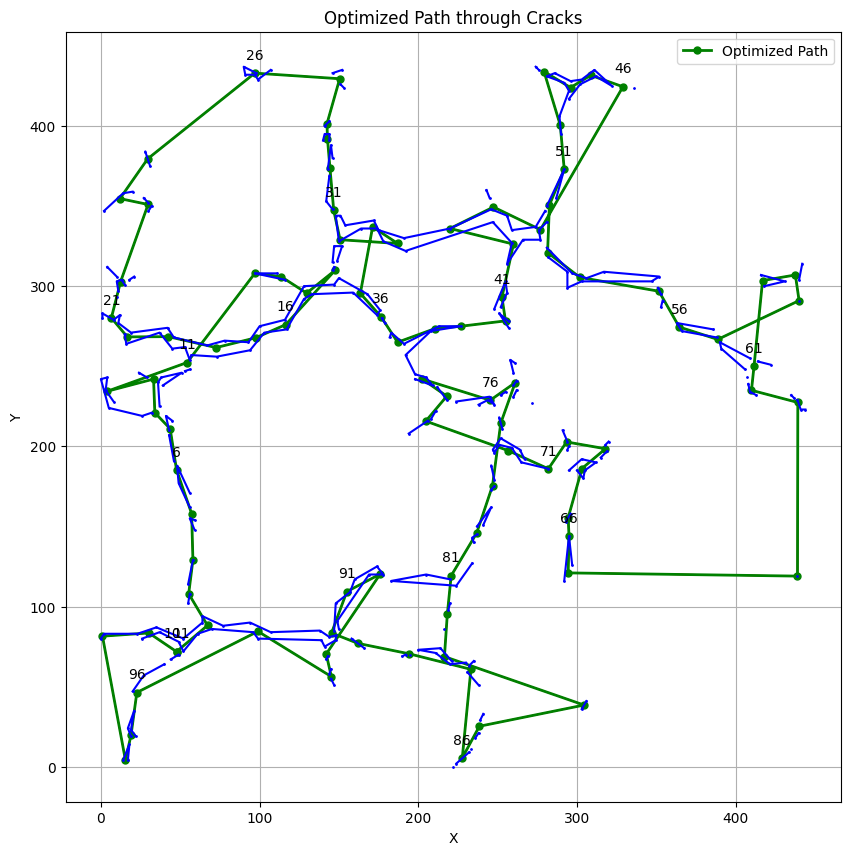

In [ ]:
# Example usage:
input_path = '/content/drive/MyDrive/Road_surface_crack_detection/denoised_result/output_test-10_denoised_1.4.jpg'
output_path = '/content/drive/MyDrive/Road_surface_crack_detection/opt_path_plot_1.4.png'
optimize_crack_path(input_path, output_path)

### Getting the radius at each point

In [ ]:
def calculate_radius_at_each_point(coordinates, path):
    # Calculate the radius at each point on the path

    # Initialize variables
    radii = []

    # Iterate over each point on the path
    for point in path:
        # Calculate the distance from the point to each line segment of the shape
        distances = [distance_to_line_segment(point, coordinates[i], coordinates[i+1]) for i in range(len(coordinates) - 1)]

        # Find the minimum distance, which represents the radius
        radius = min(distances)
        radii.append(radius)

    return radii

# Sample region coordinates
region_coordinates = [[4, 0], [4, 2], [3, 3], [2, 2], [3, 3], [3, 7], [2, 8], [2, 10],
                      [1, 11], [1, 14], [2, 15], [2, 17], [3, 16], [4, 17], [4, 19], [3, 20],
                      [2, 19], [1, 19], [1, 20], [0, 21], [0, 22], [1, 23], [1, 25], [0, 26],
                      [0, 28], [2, 28], [1, 27], [2, 26], [3, 26], [4, 25], [4, 24], [3, 23],
                      [3, 20], [4, 19], [4, 11], [5, 10], [5, 4], [6, 3], [6, 2], [7, 1],
                      [6, 1], [5, 0]]

# Find the path inside the closed shape
path = find_path_inside_shape(region_coordinates)

# Calculate the radius at each point on the path
radii = calculate_radius_at_each_point(region_coordinates, path)

# Print the radius at each point on the path
for i, (point, radius) in enumerate(zip(path, radii)):
    print(f"Point {i + 1}: Coordinate: {point}, Radius: {radius}")


Point 1: Coordinate: [ 1 14], Radius: 0.0
Point 2: Coordinate: [ 1 11], Radius: 0.0
Point 3: Coordinate: [ 2 10], Radius: 0.0
Point 4: Coordinate: [2 8], Radius: 0.0
Point 5: Coordinate: [2 2], Radius: 0.0
Point 6: Coordinate: [3 3], Radius: 0.0
Point 7: Coordinate: [3 3], Radius: 0.0
Point 8: Coordinate: [3 7], Radius: 0.0
Point 9: Coordinate: [4 0], Radius: 0.0
Point 10: Coordinate: [4 0], Radius: 0.0
Point 11: Coordinate: [4 2], Radius: 0.0
Point 12: Coordinate: [5 0], Radius: 0.0
Point 13: Coordinate: [5 4], Radius: 0.0
Point 14: Coordinate: [6 1], Radius: 0.0
Point 15: Coordinate: [6 2], Radius: 0.0
Point 16: Coordinate: [6 3], Radius: 0.0
Point 17: Coordinate: [7 1], Radius: 0.0
Point 18: Coordinate: [ 4 11], Radius: 0.0
Point 19: Coordinate: [ 5 10], Radius: 0.0
Point 20: Coordinate: [ 4 17], Radius: 0.0
Point 21: Coordinate: [ 4 19], Radius: 0.0
Point 22: Coordinate: [ 4 19], Radius: 0.0
Point 23: Coordinate: [ 4 24], Radius: 0.0
Point 24: Coordinate: [ 4 25], Radius: 0.0
Point